In [1]:
#Load required packages
%matplotlib inline
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import pandas as pd
import cftime
from tqdm import tqdm
import cmocean as cm
import sys, os
from datetime import datetime

import numpy as np
import cartopy.crs as ccrs
from dask.distributed import Client
import cartopy.feature as cfeature
from matplotlib.patches import Rectangle
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
import matplotlib.ticker as mticker

In [2]:
# Load workers:
client = Client(threads_per_worker=1)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 28
Total threads: 28,Total memory: 126.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34825,Workers: 28
Dashboard: /proxy/8787/status,Total threads: 28
Started: Just now,Total memory: 126.00 GiB
Comm: tcp://127.0.0.1:43359,Total threads: 1
Dashboard: /proxy/34357/status,Memory: 4.50 GiB
Nanny: tcp://127.0.0.1:33261,


## Weddell Sea MHWs – Analysis of Drivers and Statistics in the Seasonal Ice Zone

In [4]:
ds = xr.open_dataset('/scratch/e14/ts7341/mhw_stats_ws.nc')

In [5]:
ds

<xarray.Dataset> Size: 395MB
Dimensions:                 (lat: 66, lon: 320, event: 57)
Coordinates:
  * lon                     (lon) float64 3kB -59.88 -59.62 ... 19.62 19.88
  * lat                     (lat) float64 528B -69.99 -69.88 ... -63.17 -63.06
  * event                   (event) int64 456B 0 1 2 3 4 5 ... 51 52 53 54 55 56
Data variables:
    main_driver             (lat, lon, event) <U23 111MB ...
    main_driver_value       (lat, lon, event) float64 10MB ...
    secondary_driver        (lat, lon, event) <U23 111MB ...
    secondary_driver_value  (lat, lon, event) float64 10MB ...
    sub_driver              (lat, lon, event) <U17 82MB ...
    sub_driver_value        (lat, lon, event) float64 10MB ...
    breakdown_driver        (lat, lon, event) <U9 43MB ...
    breakdown_driver_value  (lat, lon, event) float64 10MB ...
    event_start_date        (lat, lon, event) datetime64[ns] 10MB ...

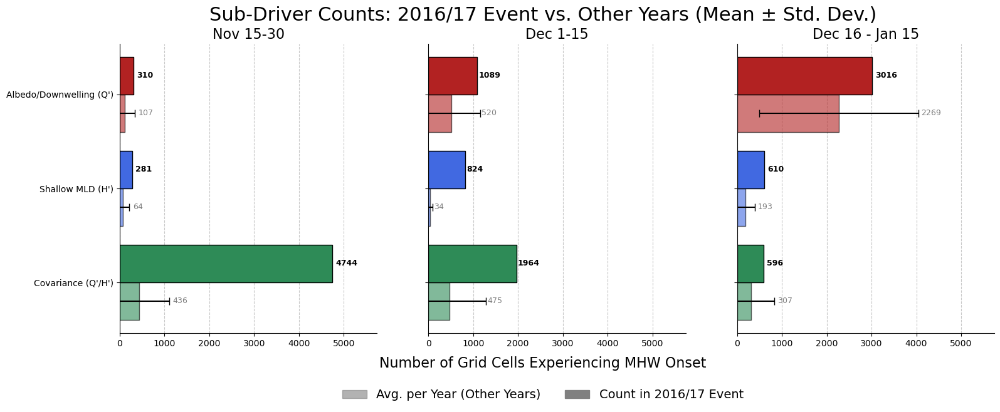

In [9]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.ticker as mticker
import calendar

# --- CONFIGURATION (same as before) ---
sub_drivers = ["Qprime_1ovrHbar", "Qbar_1ovrHprime", "Qprime_1ovrHprime"]
sub_driver_colors = {
    "Qprime_1ovrHbar": "firebrick",
    "Qbar_1ovrHprime": "royalblue",
    "Qprime_1ovrHprime": "seagreen"
}
sub_driver_labels = {
    "Qprime_1ovrHbar": "Albedo/Downwelling (Q')",
    "Qbar_1ovrHprime": "Shallow MLD (H')",
    "Qprime_1ovrHprime": "Covariance (Q'/H')"
}

# --- STATISTICAL AND PLOTTING FUNCTIONS (No changes needed here) ---

def calculate_yearly_stats(ds, drivers):
    """
    Groups data by year using pandas for robustness, calculates the count of 
    each driver for each year, and then computes the mean and standard 
    deviation of these yearly counts.
    """
    df = ds[['sub_driver', 'main_driver', 'event_start_date']].to_dataframe()
    df = df.dropna()
    df = df[df['main_driver'].isin(['Net Shortwave', 'Surface Fluxes Less SW'])]
    df = df.query("sub_driver != ''")

    if df.empty:
        return {drv: 0 for drv in drivers}, {drv: 0 for drv in drivers}

    df['year'] = df['event_start_date'].dt.year
    yearly_counts = pd.crosstab(df['year'], df['sub_driver'])
    yearly_counts = yearly_counts.reindex(columns=drivers, fill_value=0)

    means = yearly_counts.mean().to_dict()
    stds = yearly_counts.std().to_dict()
    
    return means, stds

def plot_dual_barchart_with_errors(ax, means_other, stds_other, counts_2016_17, drivers, colors, labels):
    """
    Plots a grouped horizontal bar chart with error bars, with text labels
    placed at the end of the error bar.
    """
    values_other = [means_other.get(drv, 0) for drv in drivers]
    errors_other = [stds_other.get(drv, 0) for drv in drivers]
    values_2016_17 = [counts_2016_17.get(drv, 0) for drv in drivers]

    y_pos = np.arange(len(drivers))
    bar_height = 0.4
    
    bars1 = ax.barh(y_pos + bar_height / 2, values_other, height=bar_height,
                    xerr=errors_other, capsize=4,
                    color=[colors[drv] for drv in drivers], alpha=0.6,
                    edgecolor='black', zorder=3, label='Avg. per Year (Other Years)')

    bars2 = ax.barh(y_pos - bar_height / 2, values_2016_17, height=bar_height,
                    color=[colors[drv] for drv in drivers],
                    edgecolor='black', zorder=3, label='Count in 2016/17')

    ax.set_yticks(y_pos, labels=[labels[drv] for drv in drivers])
    ax.invert_yaxis()
    ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)
    
    padding = 0.015 * ax.get_xlim()[1]

    for i, bar in enumerate(bars1):
        mean_val = values_other[i]
        std_val = errors_other[i]
        text_x_pos = mean_val + std_val + padding
        if mean_val > 0:
            ax.text(text_x_pos, bar.get_y() + bar.get_height()/2.,
                    f'{mean_val:.0f}', ha='left', va='center', fontsize=9, color='gray')
            
    for i, bar in enumerate(bars2):
        count_val = values_2016_17[i]
        text_x_pos = bar.get_width() + padding
        if count_val > 0:
            ax.text(text_x_pos, bar.get_y() + bar.get_height()/2.,
                    f'{count_val:.0f}', ha='left', va='center', fontsize=9, weight='bold')

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

# ==============================================================================
# --- MAIN EXECUTION ---
# ==============================================================================
if __name__ == '__main__':
    file_path = '/scratch/e14/ts7341/mhw_stats_ws.nc'
    onset_ds_raw = xr.open_dataset(file_path)

    # --- DEFINE THE NEW TIME BINS ---
    time_bins = [
        {'label': 'Nov 15-30', 'start_month': 11, 'start_day': 15, 'end_month': 11, 'end_day': 30, 'event_year': 2016},
        {'label': 'Dec 1-15',  'start_month': 12, 'start_day': 1,  'end_month': 12, 'end_day': 15, 'event_year': 2016},
        {'label': 'Dec 16 - Jan 15', 'start_month': 12, 'start_day': 16, 'end_month': 1, 'end_day': 15, 'event_year': 2016}
    ]

    fig, axes = plt.subplots(
        nrows=1, ncols=3,
        figsize=(18, 6),
        sharey=True
    )

    for i, bin_info in enumerate(time_bins):
        ax = axes[i]
        dates = onset_ds_raw['event_start_date']
        
        # --- BUILD MASKS BASED ON BIN DEFINITION ---
        sm, sd = bin_info['start_month'], bin_info['start_day']
        em, ed = bin_info['end_month'], bin_info['end_day']
        event_year = bin_info['event_year']

        if sm == em:  # Case for single-month bins (Nov, Dec 1-15)
            # General mask for the date range across all years
            date_range_mask = (dates.dt.month == sm) & (dates.dt.day >= sd) & (dates.dt.day <= ed)
            # Mask for the specific 2016/17 event year
            mask_2016_17 = date_range_mask & (dates.dt.year == event_year)
            # Mask for all other years is the date range MINUS the event year
            mask_other = date_range_mask & (dates.dt.year != event_year)
            
        else:  # Case for the year-spanning bin (Dec 16 - Jan 15)
            # Mask for the specific 2016/17 event transition
            mask_dec16 = (dates.dt.month == sm) & (dates.dt.day >= sd) & (dates.dt.year == event_year)
            mask_jan17 = (dates.dt.month == em) & (dates.dt.day <= ed) & (dates.dt.year == event_year + 1)
            mask_2016_17 = mask_dec16 | mask_jan17
            
            # General mask for this date window across ALL years
            mask_dec_all = (dates.dt.month == sm) & (dates.dt.day >= sd)
            mask_jan_all = (dates.dt.month == em) & (dates.dt.day <= ed)
            date_range_mask = mask_dec_all | mask_jan_all
            
            # Mask for other years is the general date window MINUS the specific 2016/17 transition
            mask_other = date_range_mask & (~mask_2016_17)

        # Apply the final masks to get the two datasets for comparison
        ds_2016_17 = onset_ds_raw.where(mask_2016_17, drop=True)
        ds_other = onset_ds_raw.where(mask_other, drop=True)
        
        # Calculate statistics and plot
        means_other, stds_other = calculate_yearly_stats(ds_other, sub_drivers)
        means_2016_17, _ = calculate_yearly_stats(ds_2016_17, sub_drivers)

        plot_dual_barchart_with_errors(ax, means_other, stds_other, means_2016_17,
                                      sub_drivers, sub_driver_colors, sub_driver_labels)
        ax.set_title(bin_info['label'], fontsize=16)

    # Set a shared X-axis limit after all plots are made
    max_lim = max(ax.get_xlim()[1] for ax in axes)
    for ax in axes:
        ax.set_xlim(0, max_lim * 1.15)

    # --- FINALIZE AND SHOW PLOT ---
    fig.suptitle("Sub-Driver Counts: 2016/17 Event vs. Other Years (Mean ± Std. Dev.)", fontsize=22)
    fig.supxlabel('Number of Grid Cells Experiencing MHW Onset', fontsize=16)
    
    handles = [
        plt.Rectangle((0,0),1,1, color='gray', alpha=0.6, label='Avg. per Year (Other Years)'),
        plt.Rectangle((0,0),1,1, color='gray', label='Count in 2016/17 Event')
    ]
    fig.legend(handles=handles, loc='lower center', ncol=2, fontsize=14, 
               bbox_to_anchor=(0.5, -0.1), frameon=False)
    
    #plt.tight_layout(rect=[0, 0.1, 1, 0.92])
    plt.show()

### Pre-2016 and Post-2016

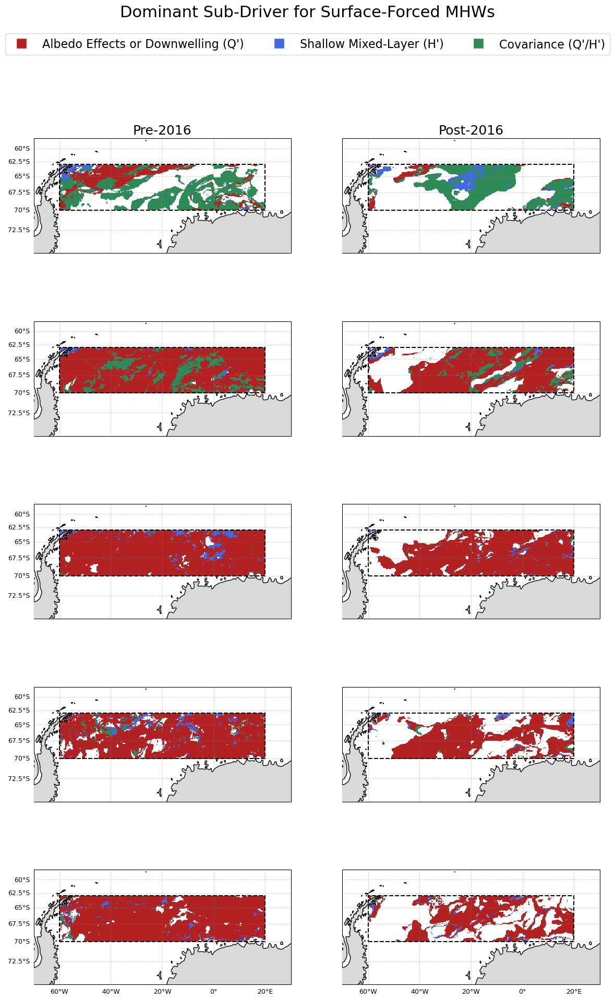

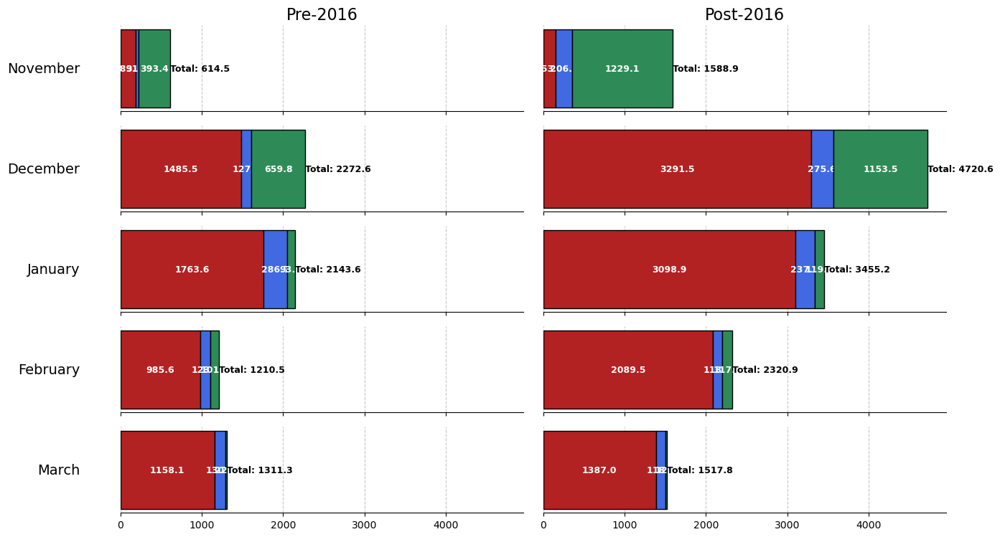

<Figure size 640x480 with 0 Axes>

In [28]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Rectangle
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
import calendar

# --- CONFIGURATION for Sub-Drivers ---
sub_drivers = ["Qprime_1ovrHbar", "Qbar_1ovrHprime", "Qprime_1ovrHprime"]
sub_driver_colors = {
    "Qprime_1ovrHbar": "firebrick",
    "Qbar_1ovrHprime": "royalblue",
    "Qprime_1ovrHprime": "seagreen",
    "No Data": '#d9d9d9'
}
sub_driver_labels = {
    "Qprime_1ovrHbar": "Albedo Effects or Downwelling (Q')",
    "Qbar_1ovrHprime": "Shallow Mixed-Layer (H')",
    "Qprime_1ovrHprime": "Covariance (Q'/H')"
}

# Map and analysis parameters
MIN_EVENTS_FOR_MAP = 1
RECT_LON_180 = (-60, 20)
RECT_LAT = (-70, -63)
PAD_LON = 10
PAD_LAT = 5
ZOOM_EXTENT = [RECT_LON_180[0] - PAD_LON, RECT_LON_180[1] + PAD_LON, RECT_LAT[0] - PAD_LAT, RECT_LAT[1] + PAD_LAT]

# --- HELPER FUNCTIONS (Unchanged) ---

def compute_driver_fractions_vectorized(ds, drivers, driver_var):
    """Computes gridded fractions and total counts using fast, vectorized xarray operations."""
    ds[driver_var] = ds[driver_var].where(ds[driver_var] != '')
    ds_stacked = ds.stack(events=('event',))
    total_valid = ds_stacked[driver_var].notnull().sum(dim='events')
    frac_ds = xr.Dataset(coords=ds.coords)
    for drv in drivers:
        count = (ds_stacked[driver_var] == drv).sum(dim='events')
        frac = xr.where(total_valid > 0, count / total_valid, np.nan)
        frac_ds[drv] = frac
    return frac_ds, total_valid

def plot_dominant_driver_map(ax_map, frac_ds, drivers, total_valid, colors, min_events, is_left_col=False, is_bottom_row=False):
    """Plots the dominant driver map, applying the MIN_EVENTS mask."""
    frac_array = xr.concat([frac_ds[drv] for drv in drivers], dim='driver')
    mask = (total_valid < min_events)
    frac_array_filled = frac_array.fillna(-1)
    dominant_idx = frac_array_filled.argmax(dim='driver', skipna=False)
    dominant_idx_masked = dominant_idx.where(~mask)
    cmap = mcolors.ListedColormap([colors[drv] for drv in drivers])
    dominant_idx_masked.plot.pcolormesh(
        ax=ax_map, cmap=cmap, vmin=-0.5, vmax=len(drivers)-0.5,
        transform=ccrs.PlateCarree(), add_colorbar=False
    )
    ax_map.add_feature(cfeature.LAND, facecolor=colors['No Data'], zorder=5)
    ax_map.coastlines(zorder=5)
    rect = Rectangle((RECT_LON_180[0], RECT_LAT[0]), RECT_LON_180[1]-RECT_LON_180[0], RECT_LAT[1]-RECT_LAT[0],
                     linewidth=1.5, edgecolor='black', facecolor='none', linestyle='--',
                     transform=ccrs.PlateCarree(), zorder=6)
    ax_map.add_patch(rect)
    gl = ax_map.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False; gl.right_labels = False
    gl.left_labels = is_left_col; gl.bottom_labels = is_bottom_row
    gl.xlabel_style = {'size': 9}; gl.ylabel_style = {'size': 9}
    ax_map.set_extent(ZOOM_EXTENT, crs=ccrs.PlateCarree())

def plot_normalized_event_rate_barchart(ax_bar, all_valid_events_series, drivers, colors, num_years_in_period):
    """Calculates event rates (events/year) and plots them as a stacked horizontal bar."""
    if num_years_in_period == 0 or all_valid_events_series.empty:
        ax_bar.text(0.5, 0.5, "No Events", ha='center', va='center', transform=ax_bar.transAxes)
        return

    event_counts = all_valid_events_series.value_counts()
    left = 0
    total_rate = 0
    
    for drv in drivers:
        count = event_counts.get(drv, 0)
        rate = count / num_years_in_period
        ax_bar.barh(0, rate, left=left, color=colors[drv], edgecolor='black', zorder=3, label=sub_driver_labels[drv])
        
        if rate > 0.1:
             ax_bar.text(left + rate / 2, 0, f'{rate:.1f}', ha='center', va='center', color='white', weight='bold', fontsize=9)
        left += rate
        total_rate += rate

    ax_bar.set_yticks([])
    ax_bar.spines[['right', 'top', 'left']].set_visible(False)
    ax_bar.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)
    
    if total_rate > 0:
        ax_bar.text(total_rate + 0.1, 0, f'Total: {total_rate:.1f}', va='center', ha='left', weight='bold', fontsize=9)

# ==============================================================================
# --- MAIN EXECUTION: PRE vs POST 2016, MONTH-BY-MONTH COMPARISON ---
# ==============================================================================
if __name__ == '__main__':
    file_path = '/scratch/e14/ts7341/mhw_stats_ws.nc'
    onset_ds_raw = xr.open_dataset(file_path)

    # --- DEFINE ANALYSIS PERIODS AND SEASON ---
    pivot_year = 2016
    season_months = [11, 12, 1, 2, 3]
    periods = [('Pre-2016', 'pre'), ('Post-2016', 'post')]
    
    # --- CRUCIAL STEP: Define a 'season_year' for proper period filtering ---
    season_year = xr.where(
        onset_ds_raw['event_start_date'].dt.month >= 11,
        onset_ds_raw['event_start_date'].dt.year,
        onset_ds_raw['event_start_date'].dt.year - 1
    )
    onset_ds_raw['season_year'] = season_year
    
    # --- *** FIX IS HERE *** ---
    # Get all season year values as a NumPy array, which will include NaNs
    all_season_years_with_nans = onset_ds_raw['season_year'].values
    # Use NumPy's boolean indexing to keep only the non-NaN (finite) values
    valid_season_years = all_season_years_with_nans[np.isfinite(all_season_years_with_nans)]
    # Now find the unique years from the clean 1D array
    all_season_years = np.unique(valid_season_years)
    # --- *** END FIX *** ---

    num_years = {
        'pre': np.sum(all_season_years < pivot_year),
        'post': np.sum(all_season_years >= pivot_year)
    }

    # --- SETUP 5x2 PLOT GRIDS (5 months, 2 periods) ---
    fig_maps, axes_maps = plt.subplots(
        nrows=5, ncols=2, figsize=(14, 22),
        subplot_kw={'projection': ccrs.Mercator(central_longitude=np.mean(RECT_LON_180))}
    )
    fig_bars, axes_bars = plt.subplots(
        nrows=5, ncols=2, figsize=(14, 8), sharex=True
    )

    # --- NESTED LOOP: Iterate through months, then periods ---
    for row_idx, month in enumerate(season_months):
        for col_idx, (period_title, period_key) in enumerate(periods):
            ax_map = axes_maps[row_idx, col_idx]
            ax_bar = axes_bars[row_idx, col_idx]
            num_years_in_period = num_years[period_key]

            # --- APPLY FILTERS using 'season_year' ---
            month_mask = onset_ds_raw['event_start_date'].dt.month == month
            if period_key == 'pre':
                period_mask = (onset_ds_raw['season_year'] < pivot_year)
            else:
                period_mask = (onset_ds_raw['season_year'] >= pivot_year)
            
            final_mask = month_mask & period_mask
            period_ds = onset_ds_raw.where(final_mask, drop=False)
            surface_forced_ds = period_ds.where(
                period_ds['main_driver'].isin(['Net Shortwave', 'Surface Fluxes Less SW']), drop=False
            )

            # --- MAP PLOT ---
            frac_sub, total_valid_sub = compute_driver_fractions_vectorized(surface_forced_ds, sub_drivers, 'sub_driver')
            plot_dominant_driver_map(ax_map, frac_sub, sub_drivers, total_valid_sub, sub_driver_colors, MIN_EVENTS_FOR_MAP,
                                     is_left_col=(col_idx == 0), is_bottom_row=(row_idx == len(season_months) - 1))

            # --- NORMALIZED BAR CHART ---
            all_valid_events = surface_forced_ds['sub_driver'].stack(z=('lat', 'lon', 'event')).to_series().dropna()
            all_valid_events = all_valid_events[all_valid_events != '']
            plot_normalized_event_rate_barchart(ax_bar, all_valid_events, sub_drivers, sub_driver_colors, num_years_in_period)
            
            # --- TITLES ---
            if row_idx == 0:
                ax_map.set_title(period_title, fontsize=18)
                ax_bar.set_title(period_title, fontsize=16)
            if col_idx == 0:
                ax_bar.text(-0.1, 0.5, calendar.month_name[month], transform=ax_bar.transAxes, 
                            fontsize=14, ha='right', va='center')

    # --- FINALIZE MAP PLOT ---
    fig_maps.suptitle("Dominant Sub-Driver for Surface-Forced MHWs", fontsize=22)
    handles = [Line2D([0], [0], marker='s', color='w', label=sub_driver_labels[drv],
                      markerfacecolor=sub_driver_colors[drv], markersize=15) for drv in sub_drivers]
    fig_maps.legend(handles=handles, loc='upper center', ncol=len(sub_drivers),
                    fontsize=16, bbox_to_anchor=(0.5, 0.96))
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    # --- FINALIZE BAR CHART PLOT ---
    fig_bars.suptitle("Annual Rate of Surface-Forced MHWs by Sub-Driver", fontsize=20)
    fig_bars.supxlabel("Events per Year", fontsize=16)
    handles, labels = axes_bars[0,0].get_legend_handles_labels()
    fig_bars.legend(handles, labels, loc='upper center', ncol=len(sub_drivers),
                    fontsize=14, bbox_to_anchor=(0.5, 0.96))
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

### Code for manuscript Figure 3

--- Top 10 Summers by MHW Grid Cells (Nov + Dec Combined) ---
summer_year
2017    15480
2011    12446
1990     9300
2005     9266
2018     8981
2024     8953
2007     7940
2020     7830
2013     6865
2021     5352
2002     5036
dtype: int64

Case Study Year: 2017
Other Top Years for comparison (N=10): [1990, 2002, 2005, 2007, 2011, 2013, 2018, 2020, 2021, 2024]


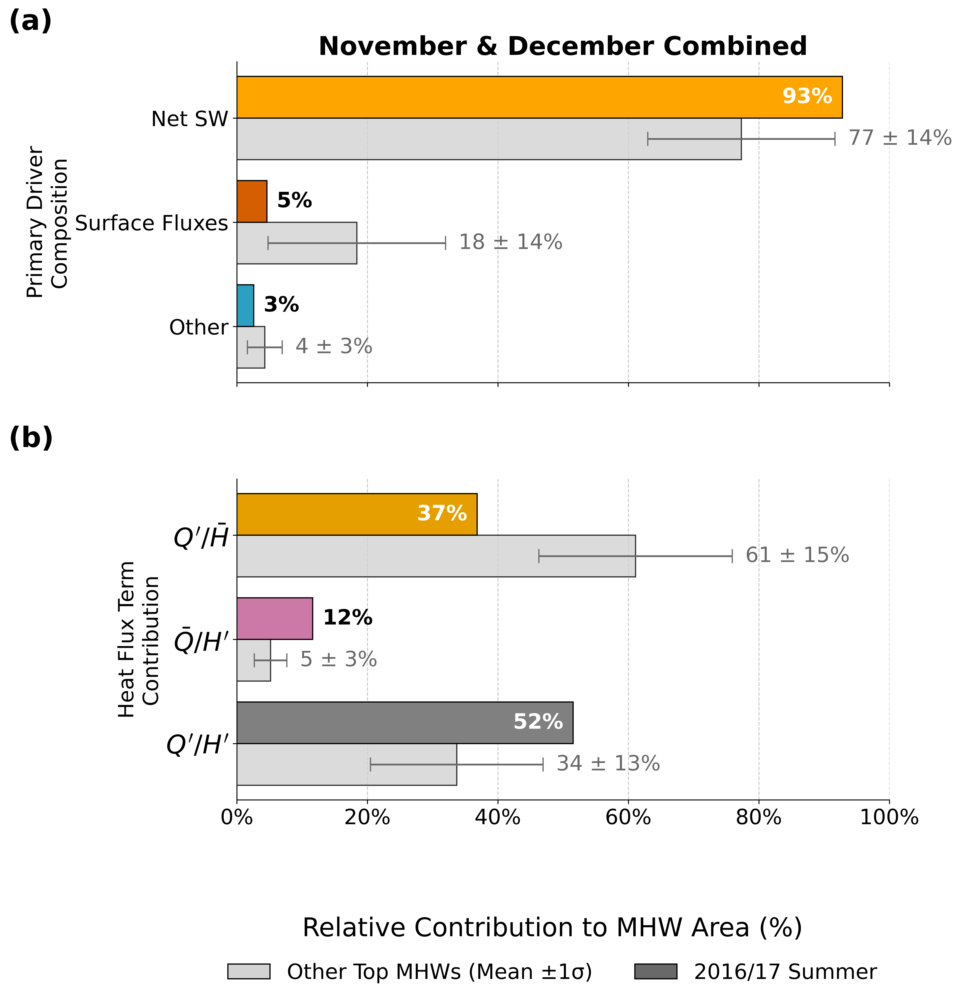

In [2]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.ticker as mticker
import calendar

# -----------------------------
# PLOT FORMATTING
# -----------------------------
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.dpi': 600,
})

# --- CONFIGURATION (Simplified Main Drivers) ---
simplified_drivers = ['Net Shortwave', 'Surface Fluxes Less SW', 'Other']
simplified_colors = {'Net Shortwave': 'orange', 'Surface Fluxes Less SW': '#D55E00', 'Other': '#2ca0c2'}
simplified_labels = {'Net Shortwave': 'Net SW', 'Surface Fluxes Less SW': 'Surface Fluxes', 'Other': 'Other'}

# --- CONFIGURATION (Sub-Drivers) ---
sub_drivers_list = ["Qprime_1ovrHbar", "Qbar_1ovrHprime", "Qprime_1ovrHprime"]
sub_driver_colors = {"Qprime_1ovrHbar": '#E69F00', "Qbar_1ovrHprime": '#CC79A7', "Qprime_1ovrHprime": 'grey'}
sub_term_labels = {"Qprime_1ovrHbar": r"$Q'/\bar{H}$", "Qbar_1ovrHprime": r"$\bar{Q}/H'$", "Qprime_1ovrHprime": r"$Q'/H'$"}

# --- ANALYSIS PARAMETERS ---
CASE_STUDY_YEAR = 2017
MONTHS_TO_PLOT = [11, 12]

# --- HELPER FUNCTIONS ---
def load_and_preprocess_data(file_path):
    ds = xr.open_dataset(file_path)
    df = ds.to_dataframe().reset_index().dropna(subset=['event_start_date', 'main_driver'])
    df['summer_year'] = np.where(df['event_start_date'].dt.month >= 11, df['event_start_date'].dt.year + 1, df['event_start_date'].dt.year)
    df['month'] = df['event_start_date'].dt.month
    conditions = [df['main_driver'] == 'Net Shortwave', df['main_driver'] == 'Surface Fluxes Less SW']
    choices = ['Net Shortwave', 'Surface Fluxes Less SW']
    df['simplified_driver'] = np.select(conditions, choices, default='Other')
    df = df[df['month'].isin(MONTHS_TO_PLOT)]
    return df

def find_top_summer_years(df, n=15):
    return df.groupby('summer_year').size().sort_values(ascending=False).head(n)

def calculate_proportions_stats(df, drivers, driver_var):
    """Calculates proportions for each year, then returns the mean and standard deviation."""
    if df.empty:
        return pd.Series(0, index=drivers), pd.Series(0, index=drivers)
    yearly_props = df.groupby('summer_year')[driver_var].value_counts(normalize=True).unstack(fill_value=0).reindex(columns=drivers, fill_value=0) * 100
    return yearly_props.mean(), yearly_props.std()

# <<< MODIFIED FUNCTION >>>
def plot_comparison_with_stddev(ax, df_subset, driver_var, drivers_list, colors, labels, case_study_year, other_top_years):
    # Data for the Case Study Year
    focus_df = df_subset[df_subset['summer_year'] == case_study_year]
    focus_props = focus_df[driver_var].value_counts(normalize=True).reindex(drivers_list, fill_value=0) * 100

    # Mean and Std Dev for Other Top Years
    other_df = df_subset[df_subset['summer_year'].isin(other_top_years)]
    mean_props_other, std_props_other = calculate_proportions_stats(other_df, drivers_list, driver_var)

    values_focus = [focus_props.get(d, 0) for d in drivers_list]
    values_other = [mean_props_other.get(d, 0) for d in drivers_list]
    errors_other = [std_props_other.get(d, 0) *.7 for d in drivers_list]

    y_pos = np.arange(len(drivers_list))
    bar_height = 0.4
    
    # Bar for "Other Years" with full standard deviation error bars
    ax.barh(y_pos + bar_height/2, values_other, height=bar_height, xerr=errors_other, capsize=6,
            color='lightgray', edgecolor='black', alpha=0.8, zorder=3, ecolor='dimgray')
    
    # Bar for "Focus Year"
    ax.barh(y_pos - bar_height/2, values_focus, height=bar_height,
            color=[colors[drv] for drv in drivers_list], edgecolor='black', zorder=3)

    ax.set_yticks(y_pos, labels=[labels.get(drv) for drv in drivers_list]); ax.invert_yaxis()
    ax.set_xlim(0, 100)
    
    # Minimalist aesthetic
    ax.xaxis.set_major_formatter(mticker.PercentFormatter())
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)

    # --- MODIFIED LABELING LOGIC ---
    # Add direct labels to bars with larger font size
    label_fontsize = 18

    # Labels for "Other Years" (Mean ± Std Dev)
    for i, val in enumerate(values_other):
        std_val = errors_other[i]
        label_text = f'{val:.0f} ± {std_val:.0f}%'
        ax.text(val + std_val + 2, y_pos[i] + bar_height/2, label_text,
                ha='left', va='center', color='dimgray', fontsize=label_fontsize)

    # Labels for "Focus Year" (placed inside the bar)
    for i, val in enumerate(values_focus):
        # If bar is long enough, put label inside
        if val > 15:
            ax.text(val - 1.5, y_pos[i] - bar_height/2, f'{val:.0f}%',
                    ha='right', va='center', color='white', weight='bold', fontsize=label_fontsize)
        # Otherwise, put it outside to avoid clutter
        else:
            ax.text(val + 1.5, y_pos[i] - bar_height/2, f'{val:.0f}%',
                    ha='left', va='center', color='black', weight='bold', fontsize=label_fontsize)

# --- MAIN EXECUTION ---
if __name__ == '__main__':
    try:
        file_path = '/scratch/e14/ts7341/mhw_stats_ws.nc'
        nov_dec_df = load_and_preprocess_data(file_path)
    except FileNotFoundError:
        print("Data file not found. Please check the path.")
        exit()


    ranked_summers = find_top_summer_years(nov_dec_df, n=11)
    print("--- Top 10 Summers by MHW Grid Cells (Nov + Dec Combined) ---")
    print(ranked_summers)
    
    top_10_summers = set(ranked_summers.index.tolist())
    # Ensure the case study year is handled correctly even if it's not in the top 10
    other_top_summers = list(top_10_summers - {CASE_STUDY_YEAR})
    
    print(f"\nCase Study Year: {CASE_STUDY_YEAR}")
    print(f"Other Top Years for comparison (N={len(other_top_summers)}): {sorted(other_top_summers)}")

    all_plot_years = [CASE_STUDY_YEAR] + other_top_summers
    plot_df = nov_dec_df[nov_dec_df['summer_year'].isin(all_plot_years)]

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 12), sharex=True)
    panel_labels = ['(a)', '(b)']
    
    # --- Top Panel: Main Drivers ---
    ax_main = axes[0]
    ax_main.set_title("November & December Combined", weight='bold')
    plot_comparison_with_stddev(ax_main, plot_df, 'simplified_driver', simplified_drivers, simplified_colors, simplified_labels, CASE_STUDY_YEAR, other_top_summers)
    ax_main.text(-0.35, 1.1, panel_labels[0], transform=ax_main.transAxes, size=24, weight='bold')
    ax_main.set_ylabel('Primary Driver\nComposition', fontsize=18)
    ax_main.tick_params(axis='y', labelsize=18)

    # --- Bottom Panel: Sub-Drivers with Uncertainty ---
    ax_sub = axes[1]
    surface_forced_df = plot_df[plot_df['main_driver'].isin(['Net Shortwave', 'Surface Fluxes Less SW'])]
    plot_comparison_with_stddev(ax_sub, surface_forced_df, 'sub_driver', sub_drivers_list, sub_driver_colors, sub_term_labels, CASE_STUDY_YEAR, other_top_summers)
    ax_sub.text(-0.35, 1.1, panel_labels[1], transform=ax_sub.transAxes, size=24, weight='bold')
    ax_sub.set_ylabel('Heat Flux Term\nContribution', fontsize=18)
    ax_sub.tick_params(axis='y', labelsize=22)
    
    fig.supxlabel('Relative Contribution to MHW Area (%)', fontsize=22)

    legend_elements = [
        Patch(facecolor='lightgray', edgecolor='k', label='Other Top MHWs (Mean ±1σ)'),
        Patch(facecolor='dimgray', edgecolor='k', label='2016/17 Summer'),
    ]
    fig.legend(handles=legend_elements, loc='lower center', ncol=2, bbox_to_anchor=(0.5, -0.05), frameon=False)
    
    fig.subplots_adjust(hspace=0.3, bottom=0.15)
    plt.savefig("/g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/mhw_dominant_driver_Weddell Sea.png", dpi=300, bbox_inches='tight')
    plt.show()

In [4]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.ticker as mticker
import calendar

# -----------------------------
# PLOT FORMATTING
# -----------------------------
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.dpi': 600,
})

# --- CONFIGURATION (Simplified Main Drivers) ---
simplified_drivers = ['Net Shortwave', 'Surface Fluxes Less SW', 'Other']
simplified_colors = {'Net Shortwave': 'orange', 'Surface Fluxes Less SW': '#D55E00', 'Other': '#2ca0c2'}
simplified_labels = {'Net Shortwave': 'Net SW', 'Surface Fluxes Less SW': 'Surface Fluxes', 'Other': 'Other'}

# --- CONFIGURATION (Sub-Drivers) ---
sub_drivers_list = ["Qprime_1ovrHbar", "Qbar_1ovrHprime", "Qprime_1ovrHprime"]
sub_driver_colors = {"Qprime_1ovrHbar": '#E69F00', "Qbar_1ovrHprime": '#CC79A7', "Qprime_1ovrHprime": 'grey'}
sub_term_labels = {"Qprime_1ovrHbar": r"$Q'/\bar{H}$", "Qbar_1ovrHprime": r"$\bar{Q}/H'$", "Qprime_1ovrHprime": r"$Q'/H'$"}

# --- ANALYSIS PARAMETERS ---
CASE_STUDY_YEAR = 2017
SPECIAL_COMPOSITE_YEARS = [2018, 2020, 2024]
SPECIAL_COMPOSITE_COLOR = '#a6bddb' # A muted blue for the new composite bar
MONTHS_TO_PLOT = [11, 12]

# --- HELPER FUNCTIONS ---
def load_and_preprocess_data(file_path):
    ds = xr.open_dataset(file_path)
    df = ds.to_dataframe().reset_index().dropna(subset=['event_start_date', 'main_driver'])
    df['summer_year'] = np.where(df['event_start_date'].dt.month >= 11, df['event_start_date'].dt.year + 1, df['event_start_date'].dt.year)
    df['month'] = df['event_start_date'].dt.month
    conditions = [df['main_driver'] == 'Net Shortwave', df['main_driver'] == 'Surface Fluxes Less SW']
    choices = ['Net Shortwave', 'Surface Fluxes Less SW']
    df['simplified_driver'] = np.select(conditions, choices, default='Other')
    df = df[df['month'].isin(MONTHS_TO_PLOT)]
    return df

def find_top_summer_years(df, n=15):
    return df.groupby('summer_year').size().sort_values(ascending=False).head(n)

def calculate_proportions_stats(df, drivers, driver_var):
    """Calculates proportions for each year, then returns the mean and standard deviation."""
    if df.empty:
        return pd.Series(0, index=drivers), pd.Series(0, index=drivers)
    yearly_props = df.groupby('summer_year')[driver_var].value_counts(normalize=True).unstack(fill_value=0).reindex(columns=drivers, fill_value=0) * 100
    return yearly_props.mean(), yearly_props.std()

def plot_three_way_comparison(ax, df_subset, driver_var, drivers_list, colors, labels, focus_year, special_years, other_years):
    # 1. Data for the Case Study Year (Focus)
    focus_df = df_subset[df_subset['summer_year'] == focus_year]
    focus_props = focus_df[driver_var].value_counts(normalize=True).reindex(drivers_list, fill_value=0) * 100

    # 2. Mean and Std Dev for the Special Composite Years
    special_df = df_subset[df_subset['summer_year'].isin(special_years)]
    mean_props_special, std_props_special = calculate_proportions_stats(special_df, drivers_list, driver_var)
    
    # 3. Mean and Std Dev for Other Top Years
    other_df = df_subset[df_subset['summer_year'].isin(other_years)]
    mean_props_other, std_props_other = calculate_proportions_stats(other_df, drivers_list, driver_var)

    # Prepare values for plotting
    values_focus = [focus_props.get(d, 0) for d in drivers_list]
    values_special = [mean_props_special.get(d, 0) for d in drivers_list]
    errors_special = [std_props_special.get(d, 0) for d in drivers_list]
    values_other = [mean_props_other.get(d, 0) for d in drivers_list]
    errors_other = [std_props_other.get(d, 0) for d in drivers_list]

    y_pos = np.arange(len(drivers_list))
    bar_height = 0.25
    
    # Plot the three bars, offset from the center y_pos
    ax.barh(y_pos + bar_height, values_other, height=bar_height, xerr=errors_other, capsize=5,
            color='lightgray', edgecolor='black', alpha=0.8, zorder=3, ecolor='dimgray')
    ax.barh(y_pos, values_special, height=bar_height, xerr=errors_special, capsize=5,
            color=SPECIAL_COMPOSITE_COLOR, edgecolor='black', zorder=3, ecolor='dimgray')
    ax.barh(y_pos - bar_height, values_focus, height=bar_height,
            color=[colors[drv] for drv in drivers_list], edgecolor='black', zorder=3)

    ax.set_yticks(y_pos, labels=[labels.get(drv) for drv in drivers_list]); ax.invert_yaxis()
    ax.set_xlim(0, 100)
    
    ax.xaxis.set_major_formatter(mticker.PercentFormatter())
    ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)
    ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)

    label_fontsize = 15
    for i, val in enumerate(values_other):
        std = errors_other[i]
        ax.text(val + std + 2, y_pos[i] + bar_height, f'{val:.0f}±{std:.0f}%', ha='left', va='center', color='dimgray', fontsize=label_fontsize)
    for i, val in enumerate(values_special):
        std = errors_special[i]
        ax.text(val + std + 2, y_pos[i], f'{val:.0f}±{std:.0f}%', ha='left', va='center', color='black', fontsize=label_fontsize)
    for i, val in enumerate(values_focus):
        if val > 15:
            ax.text(val - 1.5, y_pos[i] - bar_height, f'{val:.0f}%', ha='right', va='center', color='white', weight='bold', fontsize=label_fontsize)
        else:
            ax.text(val + 1.5, y_pos[i] - bar_height, f'{val:.0f}%', ha='left', va='center', color='black', weight='bold', fontsize=label_fontsize)

# --- MAIN EXECUTION ---
if __name__ == '__main__':
    try:
        # <<< FIX IS HERE: Corrected the file path from 'ts7431' back to 'ts7341' >>>
        file_path = '/scratch/e14/ts7341/mhw_stats_ws.nc'
        nov_dec_df = load_and_preprocess_data(file_path)

        # --- All subsequent logic is now safely inside the 'try' block ---
        
        ranked_summers = find_top_summer_years(nov_dec_df, n=15)
        top_summers_set = set(ranked_summers.index)
        
        other_top_summers = list(top_summers_set - {CASE_STUDY_YEAR} - set(SPECIAL_COMPOSITE_YEARS))
        
        print("--- MHW Summer Year Grouping ---")
        print(f"Focus Year: {CASE_STUDY_YEAR}")
        print(f"Special Composite Years (N={len(SPECIAL_COMPOSITE_YEARS)}): {sorted(SPECIAL_COMPOSITE_YEARS)}")
        print(f"Other Top MHW Years (N={len(other_top_summers)}): {sorted(other_top_summers)}")

        all_plot_years = [CASE_STUDY_YEAR] + SPECIAL_COMPOSITE_YEARS + other_top_summers
        plot_df = nov_dec_df[nov_dec_df['summer_year'].isin(all_plot_years)]

        fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 12), sharex=True)
        panel_labels = ['(a)', '(b)']
        
        # Top Panel
        ax_main = axes[0]
        ax_main.set_title("November & December Combined", weight='bold')
        plot_three_way_comparison(ax_main, plot_df, 'simplified_driver', simplified_drivers, simplified_colors, simplified_labels,
                                  CASE_STUDY_YEAR, SPECIAL_COMPOSITE_YEARS, other_top_summers)
        ax_main.text(-0.35, 1.1, panel_labels[0], transform=ax_main.transAxes, size=24, weight='bold')
        ax_main.set_ylabel('Primary Driver\nComposition', fontsize=18)
        ax_main.tick_params(axis='y', labelsize=18)

        # Bottom Panel
        ax_sub = axes[1]
        surface_forced_df = plot_df[plot_df['main_driver'].isin(['Net Shortwave', 'Surface Fluxes Less SW'])]
        plot_three_way_comparison(ax_sub, surface_forced_df, 'sub_driver', sub_drivers_list, sub_driver_colors, sub_term_labels,
                                  CASE_STUDY_YEAR, SPECIAL_COMPOSITE_YEARS, other_top_summers)
        ax_sub.text(-0.35, 1.1, panel_labels[1], transform=ax_sub.transAxes, size=24, weight='bold')
        ax_sub.set_ylabel('Heat Flux Term\nContribution', fontsize=18)
        ax_sub.tick_params(axis='y', labelsize=22)
        
        fig.supxlabel('Relative Contribution to MHW Area (%)', fontsize=22)

        legend_elements = [
            Patch(facecolor='lightgray', edgecolor='k', label='Other Top MHWs (Mean ±1σ)'),
            Patch(facecolor=SPECIAL_COMPOSITE_COLOR, edgecolor='k', label="2018, '20, '24 MHWs (Mean ±1σ)"),
            Patch(facecolor='dimgray', edgecolor='k', label='2016/17 Summer'),
        ]
        fig.legend(handles=legend_elements, loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.05), frameon=False)
        
        fig.subplots_adjust(hspace=0.3, bottom=0.15)
        plt.savefig("/g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/mhw_dominant_driver_Weddell_Sea_3way.png", dpi=300, bbox_inches='tight')
        plt.show()

    except FileNotFoundError:
        print(f"Data file not found at: {file_path}")
        print("Please ensure the path is correct and the file exists.")

--- MHW Summer Year Grouping ---
Focus Year: 2017
Special Composite Years (N=3): [2018, 2020, 2024]
Other Top MHW Years (N=11): [1983, 1990, 1991, 2002, 2005, 2006, 2007, 2011, 2013, 2016, 2021]


--- Comparing MHW Drivers for Summers: 2018, 2020, 2021, 2024 (Nov + Dec) ---


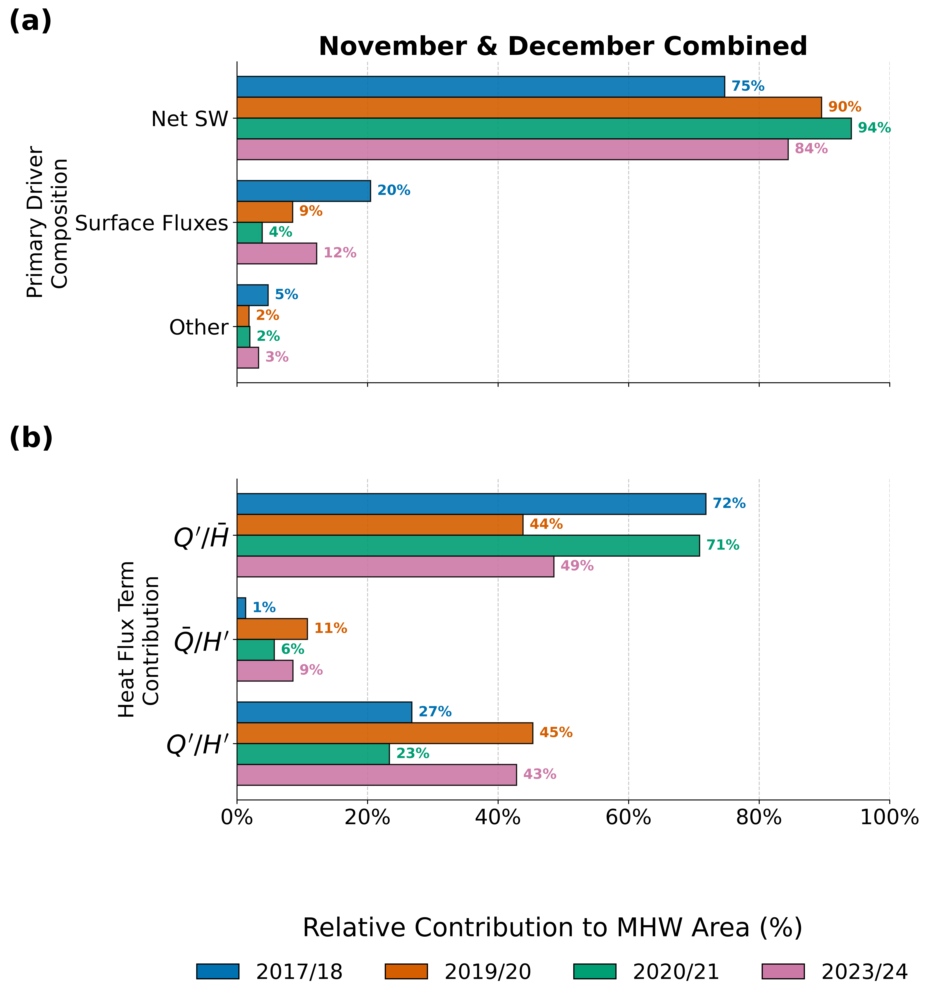

In [5]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.ticker as mticker
import calendar

# -----------------------------
# PLOT FORMATTING
# -----------------------------
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.dpi': 600,
})

# --- CONFIGURATION (Drivers and Terms) ---
simplified_drivers = ['Net Shortwave', 'Surface Fluxes Less SW', 'Other']
simplified_labels = {'Net Shortwave': 'Net SW', 'Surface Fluxes Less SW': 'Surface Fluxes', 'Other': 'Other'}

sub_drivers_list = ["Qprime_1ovrHbar", "Qbar_1ovrHprime", "Qprime_1ovrHprime"]
sub_term_labels = {"Qprime_1ovrHbar": r"$Q'/\bar{H}$", "Qbar_1ovrHprime": r"$\bar{Q}/H'$", "Qprime_1ovrHprime": r"$Q'/H'$"}

# --- ANALYSIS PARAMETERS ---
YEARS_TO_PLOT = [2018, 2020, 2021, 2024]
# Colorblind-friendly palette for the specific years
YEAR_COLORS = {2018: '#0072B2', 2020: '#D55E00', 2021: '#009E73', 2024: '#CC79A7'}
MONTHS_TO_PLOT = [11, 12]

# --- HELPER FUNCTIONS ---
def load_and_preprocess_data(file_path):
    """Loads and prepares the MHW dataset for analysis."""
    ds = xr.open_dataset(file_path)
    df = ds.to_dataframe().reset_index().dropna(subset=['event_start_date', 'main_driver'])
    df['summer_year'] = np.where(df['event_start_date'].dt.month >= 11, df['event_start_date'].dt.year + 1, df['event_start_date'].dt.year)
    df['month'] = df['event_start_date'].dt.month
    conditions = [df['main_driver'] == 'Net Shortwave', df['main_driver'] == 'Surface Fluxes Less SW']
    choices = ['Net Shortwave', 'Surface Fluxes Less SW']
    df['simplified_driver'] = np.select(conditions, choices, default='Other')
    df = df[df['month'].isin(MONTHS_TO_PLOT)]
    return df

def plot_multi_year_comparison(ax, df_subset, driver_var, drivers_list, labels, years_to_plot, year_colors):
    """
    Plots a direct comparison of MHW driver proportions for several individual years.
    """
    num_years = len(years_to_plot)
    y_pos = np.arange(len(drivers_list))
    
    # Define the height of the group of bars for each category and individual bar height
    total_group_height = 0.8
    bar_height = total_group_height / num_years

    # Loop through each year to plot its bar within the group
    for i, year in enumerate(years_to_plot):
        year_df = df_subset[df_subset['summer_year'] == year]
        
        if year_df.empty:
            print(f"Warning: No data found for year {year}. Skipping.")
            values = [0] * len(drivers_list)
        else:
            # Calculate proportions for this single year
            year_props = year_df[driver_var].value_counts(normalize=True).reindex(drivers_list, fill_value=0) * 100
            values = [year_props.get(d, 0) for d in drivers_list]

        # Calculate the vertical position for this year's bar
        # This centers the group of bars on the y-tick
        bar_y_position = y_pos - total_group_height / 2 + (i + 0.5) * bar_height
        
        ax.barh(bar_y_position, values, height=bar_height,
                color=year_colors[year], edgecolor='black', zorder=3, alpha=0.9)
        
        # Add direct percentage labels to the bars
        for j, val in enumerate(values):
            if val > 1: # Only label non-trivial bars
                ax.text(val + 1, bar_y_position[j], f'{val:.0f}%', ha='left', va='center', 
                        color=year_colors[year], weight='bold', fontsize=12)

    ax.set_yticks(y_pos, labels=[labels.get(drv) for drv in drivers_list])
    ax.invert_yaxis()
    ax.set_xlim(0, 100)
    
    # Minimalist aesthetic
    ax.xaxis.set_major_formatter(mticker.PercentFormatter())
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)

# --- MAIN EXECUTION ---
if __name__ == '__main__':
    file_path = '/scratch/e14/ts7341/mhw_stats_ws.nc'
    nov_dec_df = load_and_preprocess_data(file_path)

    # Filter the dataframe to only include the specific years for plotting
    plot_df = nov_dec_df[nov_dec_df['summer_year'].isin(YEARS_TO_PLOT)]
    
    print(f"--- Comparing MHW Drivers for Summers: {', '.join(map(str, YEARS_TO_PLOT))} (Nov + Dec) ---")

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 12), sharex=True)
    panel_labels = ['(a)', '(b)']
    
    # --- Top Panel: Main Drivers ---
    ax_main = axes[0]
    ax_main.set_title("November & December Combined", weight='bold')
    plot_multi_year_comparison(
        ax_main, plot_df, 'simplified_driver', simplified_drivers, simplified_labels,
        YEARS_TO_PLOT, YEAR_COLORS
    )
    ax_main.text(-0.35, 1.1, panel_labels[0], transform=ax_main.transAxes, size=24, weight='bold')
    ax_main.set_ylabel('Primary Driver\nComposition', fontsize=18)
    ax_main.tick_params(axis='y', labelsize=18)

    # --- Bottom Panel: Sub-Drivers ---
    ax_sub = axes[1]
    surface_forced_df = plot_df[plot_df['main_driver'].isin(['Net Shortwave', 'Surface Fluxes Less SW'])]
    plot_multi_year_comparison(
        ax_sub, surface_forced_df, 'sub_driver', sub_drivers_list, sub_term_labels,
        YEARS_TO_PLOT, YEAR_COLORS
    )
    ax_sub.text(-0.35, 1.1, panel_labels[1], transform=ax_sub.transAxes, size=24, weight='bold')
    ax_sub.set_ylabel('Heat Flux Term\nContribution', fontsize=18)
    ax_sub.tick_params(axis='y', labelsize=22)
    
    fig.supxlabel('Relative Contribution to MHW Area (%)', fontsize=22)

    # --- Create a legend for the years ---
    legend_elements = [
        Patch(facecolor=color, edgecolor='k', label=f"{year-1}/{str(year)[-2:]}") 
        for year, color in YEAR_COLORS.items() if year in YEARS_TO_PLOT
    ]
    fig.legend(handles=legend_elements, loc='lower center', ncol=len(YEARS_TO_PLOT), 
               bbox_to_anchor=(0.5, -0.05), frameon=False)
    
    fig.subplots_adjust(hspace=0.3, bottom=0.15)
    plt.savefig("/g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/mhw_dominant_driver_Weddell_Sea.png", dpi=300, bbox_inches='tight')
    plt.show()

--- Top 10 Summers by MHW Grid Cells (Nov + Dec Combined) ---
summer_year
2017    15480
2011    12446
1990     9300
2005     9266
2018     8981
2024     8953
2007     7940
2020     7830
2013     6865
2021     5352
2002     5036
dtype: int64

Case Study Year: 2017
Other Top Years for comparison (N=10): [1990, 2002, 2005, 2007, 2011, 2013, 2018, 2020, 2021, 2024]


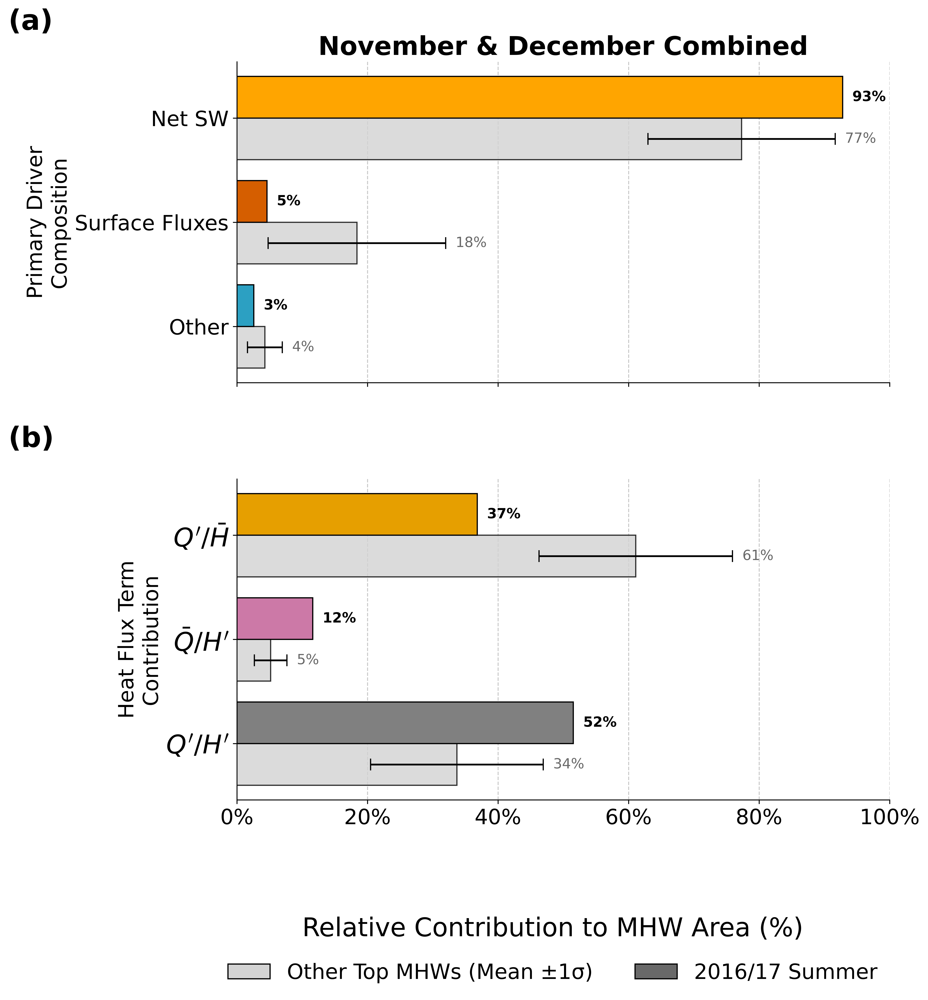

In [34]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.ticker as mticker
import calendar

# -----------------------------
# PLOT FORMATTING
# -----------------------------
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.dpi': 600,
})

# --- CONFIGURATION (Simplified Main Drivers) ---
simplified_drivers = ['Net Shortwave', 'Surface Fluxes Less SW', 'Other']
simplified_colors = {'Net Shortwave': 'orange', 'Surface Fluxes Less SW': '#D55E00', 'Other': '#2ca0c2'}
simplified_labels = {'Net Shortwave': 'Net SW', 'Surface Fluxes Less SW': 'Surface Fluxes', 'Other': 'Other'}

# --- CONFIGURATION (Sub-Drivers) ---
sub_drivers_list = ["Qprime_1ovrHbar", "Qbar_1ovrHprime", "Qprime_1ovrHprime"]
sub_driver_colors = {"Qprime_1ovrHbar": '#E69F00', "Qbar_1ovrHprime": '#CC79A7', "Qprime_1ovrHprime": 'grey'}
sub_term_labels = {"Qprime_1ovrHbar": r"$Q'/\bar{H}$", "Qbar_1ovrHprime": r"$\bar{Q}/H'$", "Qprime_1ovrHprime": r"$Q'/H'$"}

# --- ANALYSIS PARAMETERS ---
CASE_STUDY_YEAR = 2017 
MONTHS_TO_PLOT = [11,12] 

# --- HELPER FUNCTIONS ---
def load_and_preprocess_data(file_path):
    ds = xr.open_dataset(file_path)
    df = ds.to_dataframe().reset_index().dropna(subset=['event_start_date', 'main_driver'])
    df['summer_year'] = np.where(df['event_start_date'].dt.month >= 11, df['event_start_date'].dt.year + 1, df['event_start_date'].dt.year)
    df['month'] = df['event_start_date'].dt.month
    conditions = [df['main_driver'] == 'Net Shortwave', df['main_driver'] == 'Surface Fluxes Less SW']
    choices = ['Net Shortwave', 'Surface Fluxes Less SW']
    df['simplified_driver'] = np.select(conditions, choices, default='Other')
    df = df[df['month'].isin(MONTHS_TO_PLOT)]
    return df

def find_top_summer_years(df, n=15):
    return df.groupby('summer_year').size().sort_values(ascending=False).head(n)

def calculate_proportions_stats(df, drivers, driver_var):
    """Calculates proportions for each year, then returns the mean and standard deviation."""
    if df.empty:
        return pd.Series(0, index=drivers), pd.Series(0, index=drivers)
    yearly_props = df.groupby('summer_year')[driver_var].value_counts(normalize=True).unstack(fill_value=0).reindex(columns=drivers, fill_value=0) * 100
    return yearly_props.mean(), yearly_props.std()

def plot_comparison_with_stddev(ax, df_subset, driver_var, drivers_list, colors, labels, case_study_year, other_top_years):
    # Data for the Case Study Year
    focus_df = df_subset[df_subset['summer_year'] == case_study_year]
    focus_props = focus_df[driver_var].value_counts(normalize=True).reindex(drivers_list, fill_value=0) * 100

    # Mean and Std Dev for Other Top Years
    other_df = df_subset[df_subset['summer_year'].isin(other_top_years)]
    mean_props_other, std_props_other = calculate_proportions_stats(other_df, drivers_list, driver_var)

    values_focus = [focus_props.get(d, 0) for d in drivers_list]
    values_other = [mean_props_other.get(d, 0) for d in drivers_list]
    errors_other = [std_props_other.get(d, 0) * .7 for d in drivers_list]

    y_pos = np.arange(len(drivers_list))
    bar_height = 0.4
    
    # Bar for "Other Years" with error bars
    ax.barh(y_pos + bar_height/2, values_other, height=bar_height, xerr=errors_other, capsize=5,
            color='lightgray', edgecolor='black', alpha=0.8, zorder=3)
    
    # Bar for "Focus Year"
    ax.barh(y_pos - bar_height/2, values_focus, height=bar_height,
            color=[colors[drv] for drv in drivers_list], edgecolor='black', zorder=3)

    ax.set_yticks(y_pos, labels=[labels.get(drv) for drv in drivers_list]); ax.invert_yaxis()
    ax.set_xlim(0, 100)
    
    # Minimalist aesthetic
    ax.xaxis.set_major_formatter(mticker.PercentFormatter())
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)

    # Add direct labels to bars
    for i, val in enumerate(values_other):
        ax.text(val + errors_other[i] + 1.5, y_pos[i] + bar_height/2, f'{val:.0f}%', ha='left', va='center', color='dimgray')
    for i, val in enumerate(values_focus):
        ax.text(val + 1.5, y_pos[i] - bar_height/2, f'{val:.0f}%', ha='left', va='center', color='black', weight='bold')

# --- MAIN EXECUTION ---
if __name__ == '__main__':
    file_path = '/scratch/e14/ts7341/mhw_stats_ws.nc'
    nov_dec_df = load_and_preprocess_data(file_path)

    ranked_summers = find_top_summer_years(nov_dec_df, n=11)
    print("--- Top 10 Summers by MHW Grid Cells (Nov + Dec Combined) ---")
    print(ranked_summers)
    
    top_10_summers = set(ranked_summers.index.tolist())
    # Ensure the case study year is handled correctly even if it's not in the top 10
    other_top_summers = list(top_10_summers - {CASE_STUDY_YEAR})
    
    print(f"\nCase Study Year: {CASE_STUDY_YEAR}")
    print(f"Other Top Years for comparison (N={len(other_top_summers)}): {sorted(other_top_summers)}")

    all_plot_years = [CASE_STUDY_YEAR] + other_top_summers
    plot_df = nov_dec_df[nov_dec_df['summer_year'].isin(all_plot_years)]

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 12), sharex=True)
    panel_labels = ['(a)', '(b)']
    
    # --- Top Panel: Main Drivers ---
    ax_main = axes[0]
    ax_main.set_title("November & December Combined", weight='bold')
    plot_comparison_with_stddev(ax_main, plot_df, 'simplified_driver', simplified_drivers, simplified_colors, simplified_labels, CASE_STUDY_YEAR, other_top_summers)
    ax_main.text(-0.35, 1.1, panel_labels[0], transform=ax_main.transAxes, size=24, weight='bold')
    ax_main.set_ylabel('Primary Driver\nComposition', fontsize=18)
    ax_main.tick_params(axis='y', labelsize=18)

    # --- Bottom Panel: Sub-Drivers with Uncertainty ---
    ax_sub = axes[1]
    surface_forced_df = plot_df[plot_df['main_driver'].isin(['Net Shortwave', 'Surface Fluxes Less SW'])]
    plot_comparison_with_stddev(ax_sub, surface_forced_df, 'sub_driver', sub_drivers_list, sub_driver_colors, sub_term_labels, CASE_STUDY_YEAR, other_top_summers)
    ax_sub.text(-0.35, 1.1, panel_labels[1], transform=ax_sub.transAxes, size=24, weight='bold')
    ax_sub.set_ylabel('Heat Flux Term\nContribution', fontsize=18)
    ax_sub.tick_params(axis='y', labelsize=22)
    
    fig.supxlabel('Relative Contribution to MHW Area (%)', fontsize=22)

    legend_elements = [
        Patch(facecolor='lightgray', edgecolor='k', label='Other Top MHWs (Mean ±1σ)'),
        Patch(facecolor='dimgray', edgecolor='k', label='2016/17 Summer'),
    ]
    fig.legend(handles=legend_elements, loc='lower center', ncol=2, bbox_to_anchor=(0.5, -0.05), frameon=False)
    
    fig.subplots_adjust(hspace=0.3, bottom=0.15)
    plt.show()

In [15]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.ticker as mticker
import calendar

# -----------------------------
# PLOT FORMATTING
# -----------------------------
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.dpi': 600,
})

# --- CONFIGURATION (Simplified Main Drivers) ---
simplified_drivers = ['Net Shortwave', 'Surface Fluxes Less SW', 'Other']
simplified_colors = {'Net Shortwave': 'orange', 'Surface Fluxes Less SW': '#D55E00', 'Other': '#2ca0c2'}
simplified_labels = {'Net Shortwave': 'Net SW', 'Surface Fluxes Less SW': 'Surface Fluxes', 'Other': 'Other'}

# --- CONFIGURATION (Sub-Drivers) ---
sub_drivers_list = ["Qprime_1ovrHbar", "Qbar_1ovrHprime", "Qprime_1ovrHprime"]
sub_driver_colors = {"Qprime_1ovrHbar": '#E69F00', "Qbar_1ovrHprime": '#CC79A7', "Qprime_1ovrHprime": 'grey'}
# --- THIS IS THE FIX ---
sub_term_labels = {
    "Qprime_1ovrHbar": r"$Q'/\bar{H}$",  # Corrected from \barH}
    "Qbar_1ovrHprime": r"$\bar{Q}/H'$",
    "Qprime_1ovrHprime": r"$Q'/H'$"
}

# --- ANALYSIS PARAMETERS ---
MIN_AREA_THRESHOLD_PERCENT = 5.0
FOCUS_YEARS = [2016, 2017]
MONTHS_TO_PLOT = [11, 12]

# --- HELPER FUNCTIONS ---

def identify_significant_years(ds, month, total_grid_cells, threshold_pct, exclude_years=None):
    month_mask = (ds['event_start_date'].dt.month == month)
    month_ds = ds.where(month_mask, drop=True)
    df = month_ds[['event_start_date']].to_dataframe().reset_index().dropna()
    if df.empty: return []
    df['year'] = df['event_start_date'].dt.year
    area_threshold = total_grid_cells * (threshold_pct / 100.0)
    yearly_area = df.groupby('year').apply(lambda x: x[['lat', 'lon']].drop_duplicates().shape[0], include_groups=False)
    significant_years = yearly_area[yearly_area >= area_threshold].index.tolist()
    if exclude_years:
        significant_years = [y for y in significant_years if y not in exclude_years]
    return significant_years

def calculate_pooled_proportions(event_series, drivers):
    total_count = len(event_series)
    if total_count == 0: return {drv: 0 for drv in drivers}
    counts = event_series.value_counts()
    return {drv: (counts.get(drv, 0) / total_count) * 100 for drv in drivers}

def calculate_yearly_proportions_stats(df, drivers, driver_var):
    if df.empty:
        return pd.Series(index=drivers, dtype=float).fillna(0), pd.Series(index=drivers, dtype=float).fillna(0)
    yearly_proportions = df.groupby('year')[driver_var].value_counts(normalize=True).unstack(fill_value=0)
    yearly_proportions = yearly_proportions.reindex(columns=drivers, fill_value=0) * 100
    mean_props = yearly_proportions.mean()
    std_props = yearly_proportions.std()
    return mean_props, std_props

def plot_comparison_with_stddev(ax, focus_events, other_years_df, driver_var, drivers_list, colors, labels):
    props_focus = calculate_pooled_proportions(focus_events, drivers_list)
    mean_props_other, std_props_other = calculate_yearly_proportions_stats(other_years_df, drivers_list, driver_var)
    values_focus = [props_focus.get(drv, 0) for drv in drivers_list]
    values_other = [mean_props_other.get(drv, 0) for drv in drivers_list]
    errors_other = [std_props_other.get(drv, 0) for drv in drivers_list]

    y_pos = np.arange(len(drivers_list))
    bar_height = 0.4
    
    ax.barh(y_pos + bar_height/2, values_other, height=bar_height, xerr=errors_other, capsize=5,
            color='lightgray', edgecolor='black', alpha=0.8, zorder=3)
    
    ax.barh(y_pos - bar_height/2, values_focus, height=bar_height,
            color=[colors.get(drv) for drv in drivers_list], edgecolor='black', zorder=3)

    ax.set_yticks(y_pos, labels=[labels.get(drv) for drv in drivers_list]); ax.invert_yaxis()
    ax.set_xlim(0, 100); ax.xaxis.set_major_formatter(mticker.PercentFormatter())
    ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)
    ax.spines['right'].set_visible(False); ax.spines['top'].set_visible(False)

# --- MAIN EXECUTION ---
if __name__ == '__main__':
    file_path = '/scratch/e14/ts7341/mhw_stats_ws.nc'
    onset_ds_raw = xr.open_dataset(file_path)
    total_grid_cells = onset_ds_raw.sizes['lat'] * onset_ds_raw.sizes['lon']

    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12), sharex=True, sharey='row')
    panel_labels = [['(a)', '(b)'], ['(c)', '(d)']]

    is_surface_forced = onset_ds_raw['main_driver'].isin(['Net Shortwave', 'Surface Fluxes Less SW'])
    surface_forced_ds = onset_ds_raw.where(is_surface_forced, drop=True)

    for i, month in enumerate(MONTHS_TO_PLOT):
        focus_year = 2016

        # --- Row 1: Simplified Main Drivers ---
        ax_main = axes[0, i]
        other_sig_years_main = identify_significant_years(onset_ds_raw, month, total_grid_cells, 
                                                          MIN_AREA_THRESHOLD_PERCENT, exclude_years=[focus_year])
        
        month_mask = (onset_ds_raw['event_start_date'].dt.month == month)
        year_mask_focus = onset_ds_raw['event_start_date'].dt.year == focus_year
        year_mask_other = onset_ds_raw['event_start_date'].dt.year.isin(other_sig_years_main)

        focus_events_raw = onset_ds_raw['main_driver'].where(month_mask & year_mask_focus).stack(z=('lat', 'lon', 'event')).to_series().dropna()
        focus_events = focus_events_raw.apply(lambda x: x if x in simplified_drivers else 'Other')
        
        other_events_df_raw = onset_ds_raw[['main_driver', 'event_start_date']].where(month_mask & year_mask_other).to_dataframe().reset_index().dropna()
        other_events_df = other_events_df_raw.copy()
        other_events_df['main_driver'] = other_events_df_raw['main_driver'].apply(lambda x: x if x in simplified_drivers else 'Other')
        if not other_events_df.empty: other_events_df['year'] = other_events_df['event_start_date'].dt.year

        ax_main.set_title(calendar.month_name[month], weight='bold')
        plot_comparison_with_stddev(ax_main, focus_events, other_events_df, 'main_driver', simplified_drivers, simplified_colors, simplified_labels)
        ax_main.text(-0.1, 1.1, panel_labels[0][i], transform=ax_main.transAxes, size=24, weight='bold')
        ax_main.tick_params(axis='y', labelsize=18)
        
        # --- Row 2: Sub-Drivers ---
        ax_sub = axes[1, i]
        other_sig_years_sub = identify_significant_years(surface_forced_ds, month, total_grid_cells, 
                                                         MIN_AREA_THRESHOLD_PERCENT, exclude_years=[focus_year])

        month_mask_sf = (surface_forced_ds['event_start_date'].dt.month == month)
        year_mask_focus_sf = surface_forced_ds['event_start_date'].dt.year == focus_year
        year_mask_other_sf = surface_forced_ds['event_start_date'].dt.year.isin(other_sig_years_sub)

        focus_events_sub = surface_forced_ds['sub_driver'].where(month_mask_sf & year_mask_focus_sf).stack(z=('lat', 'lon', 'event')).to_series().dropna()
        focus_events_sub = focus_events_sub[focus_events_sub != '']
        
        other_events_df_sub = surface_forced_ds[['sub_driver', 'event_start_date']].where(month_mask_sf & year_mask_other_sf).to_dataframe().reset_index().dropna()
        other_events_df_sub = other_events_df_sub[other_events_df_sub['sub_driver'] != '']
        if not other_events_df_sub.empty: other_events_df_sub['year'] = other_events_df_sub['event_start_date'].dt.year

        plot_comparison_with_stddev(ax_sub, focus_events_sub, other_events_df_sub, 'sub_driver', sub_drivers_list, sub_driver_colors, sub_term_labels)
        ax_sub.text(-0.1, 1.1, panel_labels[1][i], transform=ax_sub.transAxes, size=24, weight='bold')
        ax_sub.tick_params(axis='y', labelsize=22)

    # --- Finalize Figure ---
    axes[0, 0].set_ylabel('Primary Driver Group', fontsize=18)
    axes[1, 0].set_ylabel('Heat Flux Term', fontsize=18)
    fig.supxlabel('Relative Contribution to MHW Area (%)', fontsize=22)
    
    legend_elements = [
        Patch(facecolor='lightgray', edgecolor='k', label='Other Sig. Years (Mean ±1σ)'),
        Patch(facecolor='dimgray', edgecolor='k', label='2016 Focus Year'),
    ]
    fig.legend(handles=legend_elements, loc='lower center', ncol=2, bbox_to_anchor=(0.5, -0.05), frameon=False)
    
    fig.subplots_adjust(hspace=0.3, wspace=0.1)
    plt.show()

### Time Series of MHW Activity Since 1982

Total ocean grid cells in domain: 21120


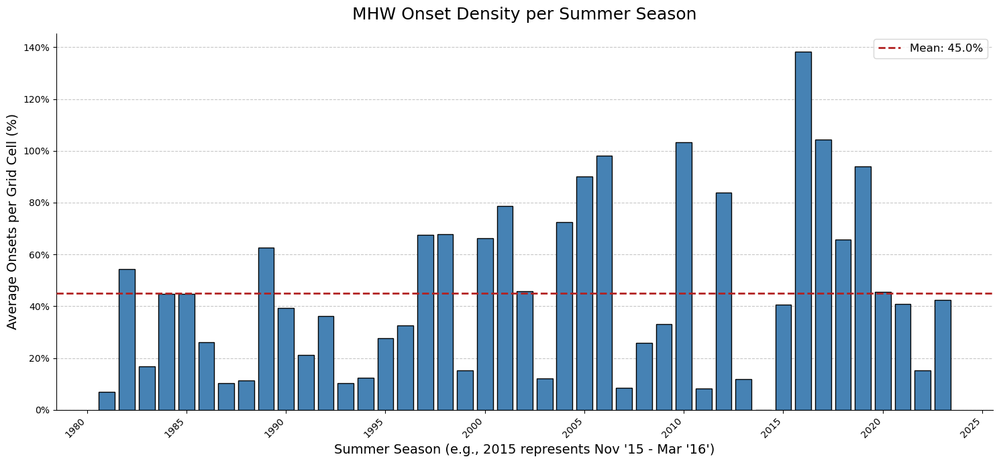

In [35]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

# ==============================================================================
# --- MAIN EXECUTION: NORMALIZED MHW ONSET DENSITY TIME SERIES ---
# ==============================================================================
if __name__ == '__main__':
    # --- STEP 1: LOAD DATASET ---
    file_path = '/scratch/e14/ts7341/mhw_stats_ws.nc'
    onset_ds_raw = xr.open_dataset(file_path)

    # --- STEP 2: DEFINE SEASON and CALCULATE 'season_year' ---
    season_months = [11, 12, 1, 2, 3]
    
    season_year = xr.where(
        onset_ds_raw['event_start_date'].dt.month.isin([11, 12]),
        onset_ds_raw['event_start_date'].dt.year,
        onset_ds_raw['event_start_date'].dt.year - 1
    )
    onset_ds_raw['season_year'] = season_year

    # --- STEP 3: CALCULATE THE NORMALIZATION FACTOR (TOTAL OCEAN AREA) ---
    total_ocean_cells = onset_ds_raw['main_driver'].isel(event=0).notnull().sum().item()
    print(f"Total ocean grid cells in domain: {total_ocean_cells}")

    # --- STEP 4: GROUP AND COUNT MHW ONSETS BY SEASON ---
    is_mhw = onset_ds_raw['event_start_date'].notnull()
    
    # --- *** THE FIX IS HERE *** ---
    # We must explicitly assign the 'season_year' coordinate to the new boolean DataArray.
    is_mhw['season_year'] = onset_ds_raw['season_year']

    # Filter for only the summer months before grouping
    is_summer_mhw = is_mhw.where(onset_ds_raw['event_start_date'].dt.month.isin(season_months))

    # Group by the 'season_year' and sum all events (True values) across all dimensions
    seasonal_mhw_counts = is_summer_mhw.groupby('season_year').sum(dim=['lat', 'lon', 'event'])

    # --- STEP 5: NORMALIZE THE COUNTS BY AREA ---
    normalized_seasonal_series = (seasonal_mhw_counts / total_ocean_cells) * 100

    # --- STEP 6: PLOT THE TIME SERIES ---
    fig, ax = plt.subplots(figsize=(15, 7))

    ax.bar(
        normalized_seasonal_series.season_year,
        normalized_seasonal_series.values,
        color='steelblue',
        edgecolor='black',
        zorder=3
    )
    
    mean_activity = normalized_seasonal_series.mean()
    ax.axhline(
        mean_activity, color='firebrick', linestyle='--', linewidth=2, zorder=4,
        label=f'Mean: {mean_activity.item():.1f}%'
    )

    # Formatting and Labels
    ax.set_title("MHW Onset Density per Summer Season", fontsize=18, pad=15)
    ax.set_ylabel("Average Onsets per Grid Cell (%)", fontsize=14)
    ax.set_xlabel("Summer Season (e.g., 2015 represents Nov '15 - Mar '16')", fontsize=14)
    ax.grid(axis='y', linestyle='--', alpha=0.7, zorder=0)
    ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)
    ax.xaxis.set_major_locator(mticker.MaxNLocator(integer=True))
    plt.xticks(rotation=45, ha='right')
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=100))
    ax.legend(fontsize=12)
    plt.tight_layout()
    plt.show()

## Ross Sea MHWs – Primary Decay Mechanisms

## Analysis in the Ross Sea

Generating monthly decay plots...
  Processing January...
  Processing February...
  Processing March...
  Processing April...
  Processing May...
  Processing June...
  Processing July...
  Processing August...
  Processing September...
  Processing October...
  Processing November...
  Processing December...
Finalizing figures...


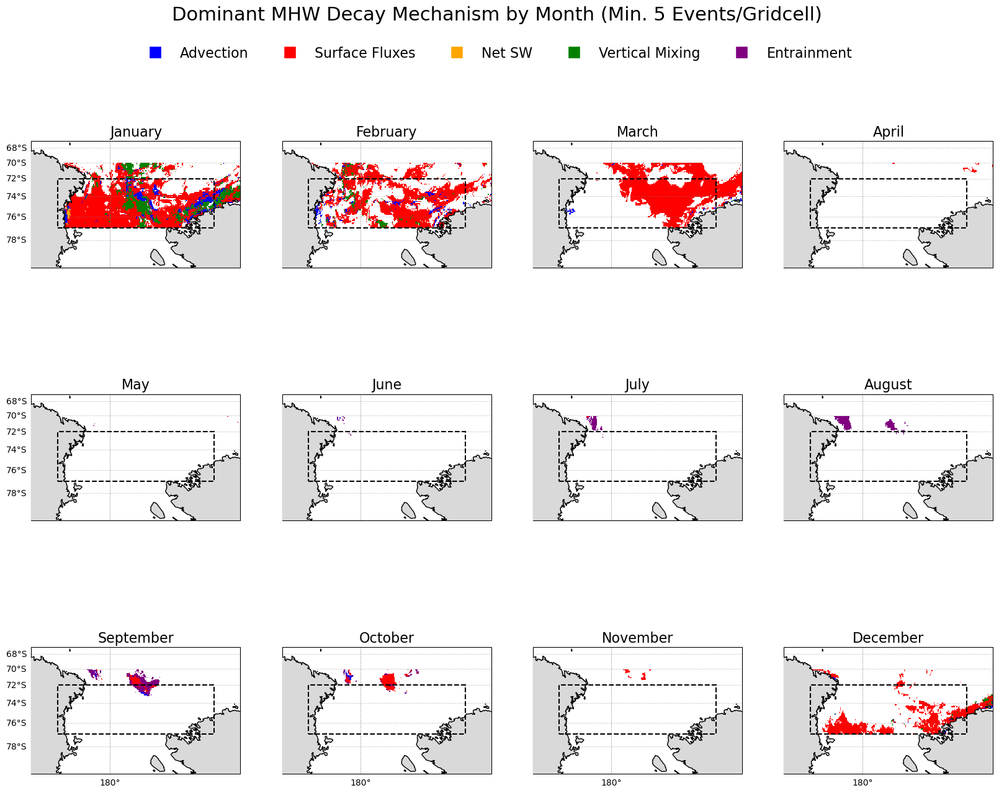

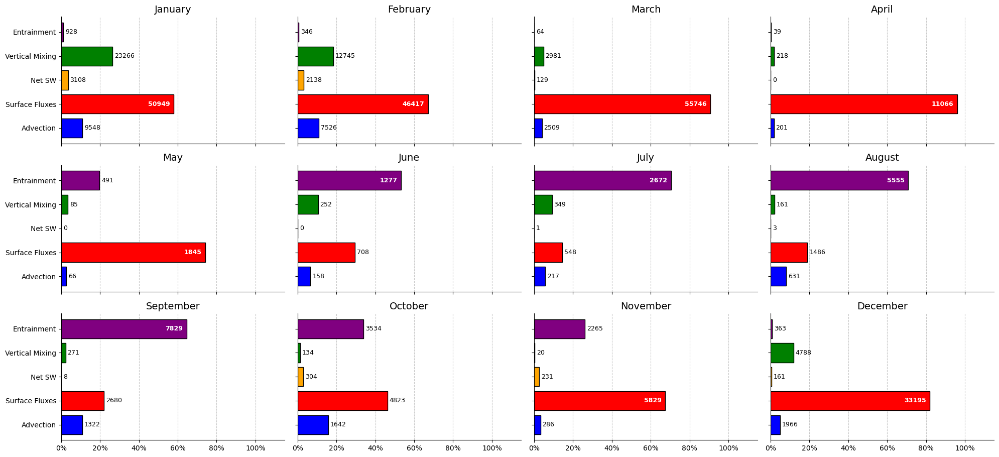

<Figure size 640x480 with 0 Axes>

In [3]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Rectangle
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
import matplotlib.ticker as mticker
import calendar

# --- CONFIGURATION ---
main_drivers = [
    'Grouped Advection', 'Surface Fluxes Less SW',
    'Net Shortwave', 'Grouped Vertical Mixing', 'entrainment'
]
driver_colors = {
    "Grouped Advection": "blue",
    "Surface Fluxes Less SW": "red",
    "Net Shortwave": "orange",
    "Grouped Vertical Mixing": "green",
    "entrainment": "purple",
    "No Data": '#d9d9d9'
}
term_labels = {
    "Grouped Advection": "Advection",
    "Surface Fluxes Less SW": "Surface Fluxes",
    "Net Shortwave": "Net SW",
    "Grouped Vertical Mixing": "Vertical Mixing",
    "entrainment": "Entrainment"
}

# Map and analysis parameters for the Ross Sea decay dataset
MIN_EVENTS_FOR_MAP = 5      # Min events in a grid cell to be colored (adjusted for monthly analysis)
RECT_LON_180 = (-200, -140) # Ross Sea longitude in (-180, 180) range
RECT_LAT = (-77, -72)
PAD_LON = 10
PAD_LAT = 5
ZOOM_EXTENT = [RECT_LON_180[0] - PAD_LON, RECT_LON_180[1] + PAD_LON, RECT_LAT[0] - PAD_LAT, RECT_LAT[1] + PAD_LAT]
CENTRAL_LONGITUDE_MAP = 180 # For a Pacific-centered view

# --- HELPER FUNCTIONS ---

def normalize_longitude(ds: xr.Dataset) -> xr.Dataset:
    """Robustly converts longitudes to the 0-360 range for plotting."""
    ds = ds.copy()
    # Use modulo arithmetic to wrap longitudes into the 0-360 range
    ds.coords['lon'] = (ds['lon'].values + 360) % 360
    ds = ds.sortby('lon')
    return ds

def compute_driver_fractions_vectorized(ds, drivers, driver_var):
    """
    Computes gridded fractions and total counts using fast, vectorized xarray operations.
    Handles potential empty string values in the driver data.
    """
    ds[driver_var] = ds[driver_var].where(ds[driver_var] != '')
    ds_stacked = ds.stack(events=('event',))
    total_valid = ds_stacked[driver_var].notnull().sum(dim='events')
    frac_ds = xr.Dataset(coords=ds.coords)
    for drv in drivers:
        count = (ds_stacked[driver_var] == drv).sum(dim='events')
        frac = xr.where(total_valid > 0, count / total_valid, np.nan)
        frac_ds[drv] = frac
    return frac_ds, total_valid

def plot_dominant_driver_map(ax_map, frac_ds, drivers, total_valid, colors, min_events, is_left_col=False, is_bottom_row=False):
    """
    Plots the dominant driver map, applying the MIN_EVENTS mask and controlling axis labels.
    """
    frac_array = xr.concat([frac_ds[drv] for drv in drivers], dim='driver')
    mask = (total_valid < min_events)
    frac_array_filled = frac_array.fillna(-1)
    dominant_idx = frac_array_filled.argmax(dim='driver', skipna=False)
    dominant_idx_masked = dominant_idx.where(~mask)
    cmap = mcolors.ListedColormap([colors[drv] for drv in drivers])

    # Plot the data using the data's own coordinates (which are 0-360 after normalization)
    dominant_idx_masked.plot.pcolormesh(
        ax=ax_map, cmap=cmap, vmin=-0.5, vmax=len(drivers)-0.5,
        transform=ccrs.PlateCarree(), add_colorbar=False
    )

    ax_map.add_feature(cfeature.LAND, facecolor=colors['No Data'], zorder=5)
    ax_map.coastlines(zorder=5)
    # The Rectangle needs longitudes in the -180 to 180 range for drawing
    rect = Rectangle((RECT_LON_180[0], RECT_LAT[0]), RECT_LON_180[1]-RECT_LON_180[0], RECT_LAT[1]-RECT_LAT[0],
                     linewidth=1.5, edgecolor='black', facecolor='none', linestyle='--',
                     transform=ccrs.PlateCarree(), zorder=6)
    ax_map.add_patch(rect)
    gl = ax_map.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False; gl.right_labels = False
    gl.left_labels = is_left_col; gl.bottom_labels = is_bottom_row
    gl.xlabel_style = {'size': 10}; gl.ylabel_style = {'size': 10}
    ax_map.set_extent(ZOOM_EXTENT, crs=ccrs.PlateCarree())

def plot_summary_barchart(ax_bar, all_valid_events_series, drivers, colors, labels):
    """
    Calculates overall fractions from a 1D series and plots the summary bar chart.
    Handles months with no events gracefully.
    """
    total_event_count = len(all_valid_events_series)
    if total_event_count == 0:
        ax_bar.text(0.5, 0.5, "No Events Found", ha='center', va='center', transform=ax_bar.transAxes, fontsize=12)
        ax_bar.set_xlim(0, 1.15); ax_bar.set_yticks([])
        return
    event_counts = all_valid_events_series.value_counts()
    values = [event_counts.get(drv, 0) / total_event_count for drv in drivers]
    bar_colors = [colors[drv] for drv in drivers]
    driver_labels = [labels[drv] for drv in drivers]
    y_pos = np.arange(len(drivers))
    ax_bar.barh(y_pos, values, color=bar_colors, align='center', edgecolor='black', zorder=3)
    ax_bar.set_yticks(y_pos, labels=driver_labels)
    ax_bar.invert_yaxis()
    ax_bar.set_xlim(0, 1.15)
    ax_bar.xaxis.set_major_formatter(mticker.PercentFormatter(1.0))
    ax_bar.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)
    for i, drv in enumerate(drivers):
        frac_val = event_counts.get(drv, 0) / total_event_count
        count_val = event_counts.get(drv, 0)
        label_text = f'{int(count_val)}'
        if frac_val > 0.5:
            ax_bar.text(frac_val - 0.02, i, label_text, color='white', va='center', ha='right', fontsize=9, weight='bold')
        else:
            ax_bar.text(frac_val + 0.01, i, label_text, color='black', va='center', ha='left', fontsize=9)
    ax_bar.spines['right'].set_visible(False)
    ax_bar.spines['top'].set_visible(False)

# ==============================================================================
# --- MAIN EXECUTION: MONTH-BY-MONTH DECAY ANALYSIS ---
# ==============================================================================
if __name__ == '__main__':
    # STEP 1: LOAD YOUR DATASET
    file_path = '/scratch/e14/ts7341/mhw_decay_Ross_Sea.nc'
    decay_ds_raw = xr.open_dataset(file_path)
    
    # STEP 2: NORMALIZE LONGITUDES FOR PLOTTING ACROSS DATELINE
    decay_ds = normalize_longitude(decay_ds_raw)

    # Define key variable names for clarity
    driver_variable_name = 'main_decay_driver'
    date_variable_name = 'event_end_date' # Use end date for decay analysis

    # --- SETUP PLOT GRIDS ---
    fig_maps, axes_maps = plt.subplots(
        nrows=3, ncols=4, figsize=(20, 15),
        subplot_kw={'projection': ccrs.Mercator(central_longitude=CENTRAL_LONGITUDE_MAP)}
    )
    fig_bars, axes_bars = plt.subplots(
        nrows=3, ncols=4, figsize=(20, 10),
        sharex=True, sharey=True
    )

    for i, month in enumerate(range(1, 13)):
        row = i // 4
        col = i % 4
        month_name = calendar.month_name[month]
        print(f"  Processing {month_name}...")

        ax_map = axes_maps[row, col]
        ax_bar = axes_bars[row, col]

        # --- APPLY FILTERS for the current month based on event end date ---
        month_mask = (decay_ds[date_variable_name].dt.month == month)
        month_ds = decay_ds.where(month_mask, drop=False)

        # --- MAP PLOT LOGIC for the current month ---
        frac_ds, total_valid = compute_driver_fractions_vectorized(
            month_ds, main_drivers, driver_var=driver_variable_name
        )
        is_left_col = (col == 0)
        is_bottom_row = (row == 2)
        plot_dominant_driver_map(ax_map, frac_ds, main_drivers, total_valid,
                                 driver_colors, MIN_EVENTS_FOR_MAP,
                                 is_left_col, is_bottom_row)
        ax_map.set_title(month_name, fontsize=16)

        # --- BAR CHART LOGIC for the current month ---
        all_valid_events = month_ds[driver_variable_name].stack(z=('lat', 'lon', 'event')).to_series().dropna()
        all_valid_events = all_valid_events[all_valid_events != '']
        plot_summary_barchart(ax_bar, all_valid_events, main_drivers, driver_colors, term_labels)
        ax_bar.set_title(month_name, fontsize=14)
    
    fig_maps.suptitle(f"Dominant MHW Decay Mechanism by Month (Min. {MIN_EVENTS_FOR_MAP} Events/Gridcell)", fontsize=22)
    handles = [Line2D([0], [0], marker='s', color='w', label=term_labels[drv],
                      markerfacecolor=driver_colors[drv], markersize=15) for drv in main_drivers]
    fig_maps.legend(handles=handles, loc='upper center', ncol=len(main_drivers),
                    fontsize=16, bbox_to_anchor=(0.5, 0.95), frameon=False)
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    # fig_maps.savefig("monthly_dominant_decay_maps_ross_sea.png", dpi=300)
    plt.show()

    # --- FINALIZE BAR CHART PLOT ---
    fig_bars.suptitle("Overall Contribution of Onset Mechanisms by Month", fontsize=20)
    fig_bars.supxlabel('Fraction of Total Events', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    # fig_bars.savefig("monthly_decay_barcharts_ross_sea.png", dpi=300)
    plt.show()

In [4]:
ds = xr.open_dataset('/scratch/e14/ts7341/mhw_onset_Ross_Sea.nc')

Creating exclusion mask for specific years...
Generating seasonal probability distributions...
  Processing November...
  Processing December...
  Processing January...
  Processing February...
  Processing March...
  Processing April...
  Processing May...


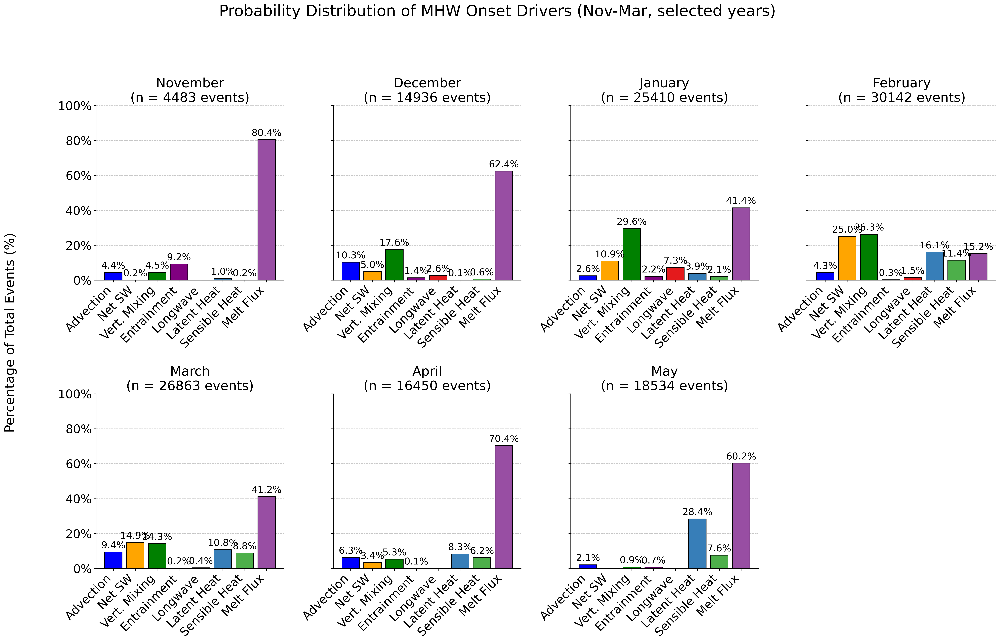

Done.


In [4]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import calendar

# --- Set global plotting parameters for a high-quality figure ---
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'font.size': 24,
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'legend.fontsize': 18,
    'xtick.labelsize': 20,
    'ytick.labelsize': 20,
    'text.color': 'black',
    'axes.labelcolor': 'black',
    'xtick.color': 'black',
    'ytick.color': 'black',
    'figure.dpi': 300,
})

# --- CONFIGURATION (UNCHANGED) ---
combined_drivers = [
    'Grouped Advection', 'Net Shortwave', 'Grouped Vertical Mixing', 'entrainment',
    'lw_heat', 'evap_heat', 'sens_heat', 'mh_flux'
]
combined_colors = {
    "Grouped Advection": "blue",
    "Net Shortwave": "orange",
    "Grouped Vertical Mixing": "green",
    "entrainment": "purple",
    "lw_heat": "#e41a1c",
    "evap_heat": "#377eb8",
    "sens_heat": "#4daf4a",
    "mh_flux": "#984ea3",
}
combined_labels = {
    "Grouped Advection": "Advection",
    "Net Shortwave": "Net SW",
    "Grouped Vertical Mixing": "Vert. Mixing",
    "entrainment": "Entrainment",
    "lw_heat": "Longwave",
    "evap_heat": "Latent Heat",
    "sens_heat": "Sensible Heat",
    "mh_flux": "Melt Flux"
}

# --- PLOTTING HELPER FUNCTION ---
def plot_probability_distribution(ax, percentages, drivers, colors, labels):
    """
    Plots a normalized probability distribution bar chart on a given axis.
    """
    values = [percentages.get(drv, 0) for drv in drivers]
    bar_colors = [colors[drv] for drv in drivers]
    x_labels = [labels[drv] for drv in drivers]
    
    x_pos = np.arange(len(drivers))
    bars = ax.bar(x_pos, values, color=bar_colors, align='center', edgecolor='black', zorder=3)
    
    ax.set_xticks(x_pos)
    ax.set_xticklabels(x_labels, rotation=45, ha='right')
    ax.set_ylim(0, 100)
    ax.yaxis.set_major_formatter(mticker.PercentFormatter())
    ax.grid(axis='y', linestyle='--', alpha=0.7, zorder=0)
    
    for bar in bars:
        height = bar.get_height()
        if height > 0.1:
            ax.annotate(f'{height:.1f}%',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3), textcoords="offset points",
                        ha='center', va='bottom', fontsize=16) # Explicitly set a smaller size
            
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

# ==============================================================================
# --- MAIN EXECUTION ---
# ==============================================================================
if __name__ == '__main__':
    #file_path = '/scratch/e14/ts7341/mhw_onset_Ross_Sea.nc'
    file_path = '/scratch/e14/ts7341/mhw_decay_ws.nc'
    onset_ds_raw = xr.open_dataset(file_path)
    onset_ds = onset_ds_raw

    date_variable_name = 'event_end_date'

    # Exclusion mask remains the same as it only affects Nov-Feb
    print("Creating exclusion mask for specific years...")
    exclusion_mask = ~(
        ((onset_ds[date_variable_name].dt.month == 11) & (onset_ds[date_variable_name].dt.year == 2021)) |
        ((onset_ds[date_variable_name].dt.month == 12) & (onset_ds[date_variable_name].dt.year == 2021)) |
        ((onset_ds[date_variable_name].dt.month == 1)  & (onset_ds[date_variable_name].dt.year == 2022)) |
        ((onset_ds[date_variable_name].dt.month == 2)  & (onset_ds[date_variable_name].dt.year == 2022))
    )
    onset_ds_filtered = onset_ds.where(exclusion_mask, drop=True)

    # --- SETUP PLOT GRID for 5 plots (2x3 layout) ---
    fig, axes = plt.subplots(
        nrows=2, ncols=4, figsize=(24, 16), sharey=True
    )
    axes = axes.flatten()

    # --- Define the months to loop over (Nov -> Mar) ---
    months_to_plot = [11, 12, 1, 2, 3,4,5]
    
    print("Generating seasonal probability distributions...")
    for i, month in enumerate(months_to_plot):
        month_name = calendar.month_name[month]
        print(f"  Processing {month_name}...")
        ax = axes[i]

        month_mask = (onset_ds_filtered[date_variable_name].dt.month == month)
        month_ds = onset_ds_filtered.where(month_mask, drop=True)

        # --- HYBRID DATA CALCULATION ---
        main_drivers_series = month_ds['main_decay_driver'].stack(z=('lat', 'lon', 'event')).to_series().dropna()
        main_drivers_series = main_drivers_series[main_drivers_series != '']
        breakdown_series = month_ds['breakdown_decay_driver'].stack(z=('lat', 'lon', 'event')).to_series().dropna()
        breakdown_series = breakdown_series[breakdown_series != '']
        total_events = len(main_drivers_series)
        
        if total_events == 0:
            ax.text(0.5, 0.5, "No Events Found", ha='center', va='center', transform=ax.transAxes, fontsize=20)
            ax.set_title(f"{month_name}", fontsize=22)
            continue
        
        main_driver_counts = main_drivers_series.value_counts()
        breakdown_driver_counts = breakdown_series.value_counts()
        
        event_counts = {}
        for drv in ['Grouped Advection', 'Net Shortwave', 'Grouped Vertical Mixing', 'entrainment']:
            event_counts[drv] = main_driver_counts.get(drv, 0)
        for drv in ['lw_heat', 'evap_heat', 'sens_heat', 'mh_flux']:
            event_counts[drv] = breakdown_driver_counts.get(drv, 0)
        
        percentages = {key: (value / total_events) * 100 for key, value in event_counts.items()}
        
        # --- PLOTTING ---
        plot_probability_distribution(ax, percentages, combined_drivers, combined_colors, combined_labels)
        ax.set_title(f"{month_name}\n(n = {total_events} events)", fontsize=22)

    # --- Turn off the unused (sixth) subplot axis ---
    axes[-1].axis('off')

    # --- FINALIZE PLOT ---
    fig.suptitle("Probability Distribution of MHW Onset Drivers (Nov-Mar, selected years)", fontsize=26)
    fig.supylabel("Percentage of Total Events (%)", fontsize=22)
    plt.tight_layout(rect=[0.03, 0.03, 1, 0.94])
    fig.savefig("/g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/seasonal_onset_driver_distribution_nov_mar_styled.png", dpi=300)
    plt.show()
    print("Done.")

Generating monthly decay plots...
  Processing January...
  Processing February...
  Processing March...
  Processing April...
  Processing May...
  Processing June...
  Processing July...
  Processing August...
  Processing September...
  Processing October...
  Processing November...
  Processing December...
Finalizing figures...


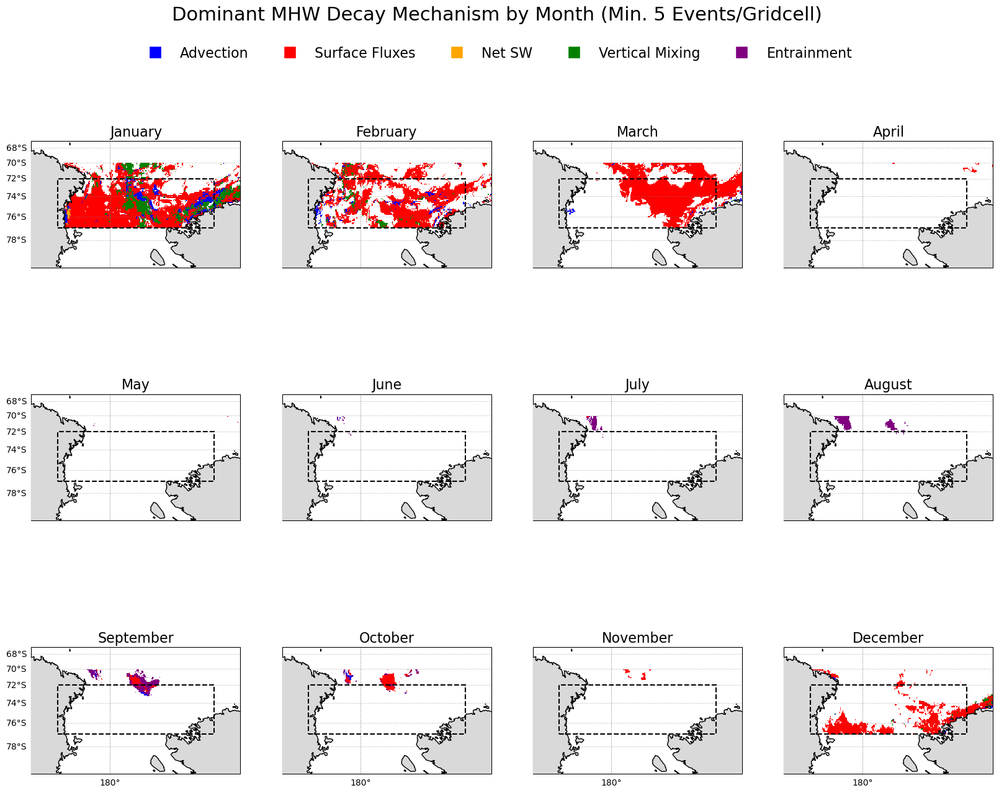

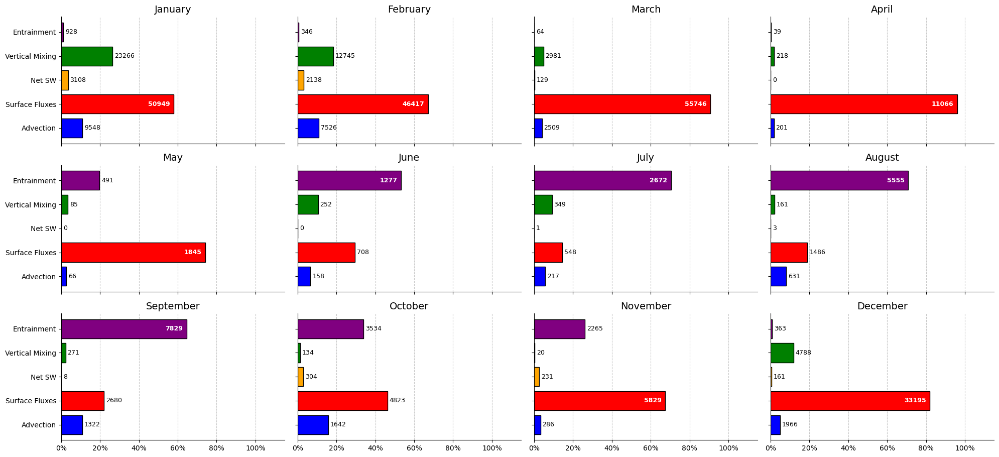

<Figure size 640x480 with 0 Axes>

Done.


In [3]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Rectangle
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
import matplotlib.ticker as mticker
import calendar

# --- CONFIGURATION ---
main_drivers = [
    'Grouped Advection', 'Surface Fluxes Less SW',
    'Net Shortwave', 'Grouped Vertical Mixing', 'entrainment'
]
driver_colors = {
    "Grouped Advection": "blue",
    "Surface Fluxes Less SW": "red",
    "Net Shortwave": "orange",
    "Grouped Vertical Mixing": "green",
    "entrainment": "purple",
    "No Data": '#d9d9d9'
}
term_labels = {
    "Grouped Advection": "Advection",
    "Surface Fluxes Less SW": "Surface Fluxes",
    "Net Shortwave": "Net SW",
    "Grouped Vertical Mixing": "Vertical Mixing",
    "entrainment": "Entrainment"
}

# Map and analysis parameters for the Ross Sea decay dataset
MIN_EVENTS_FOR_MAP = 5      # Min events in a grid cell to be colored (adjusted for monthly analysis)
RECT_LON_180 = (-200, -140) # Ross Sea longitude in (-180, 180) range
RECT_LAT = (-77, -72)
PAD_LON = 10
PAD_LAT = 5
ZOOM_EXTENT = [RECT_LON_180[0] - PAD_LON, RECT_LON_180[1] + PAD_LON, RECT_LAT[0] - PAD_LAT, RECT_LAT[1] + PAD_LAT]
CENTRAL_LONGITUDE_MAP = 180 # For a Pacific-centered view

# --- HELPER FUNCTIONS ---

def normalize_longitude(ds: xr.Dataset) -> xr.Dataset:
    """Robustly converts longitudes to the 0-360 range for plotting."""
    ds = ds.copy()
    # Use modulo arithmetic to wrap longitudes into the 0-360 range
    ds.coords['lon'] = (ds['lon'].values + 360) % 360
    ds = ds.sortby('lon')
    return ds

def compute_driver_fractions_vectorized(ds, drivers, driver_var):
    """
    Computes gridded fractions and total counts using fast, vectorized xarray operations.
    Handles potential empty string values in the driver data.
    """
    ds[driver_var] = ds[driver_var].where(ds[driver_var] != '')
    ds_stacked = ds.stack(events=('event',))
    total_valid = ds_stacked[driver_var].notnull().sum(dim='events')
    frac_ds = xr.Dataset(coords=ds.coords)
    for drv in drivers:
        count = (ds_stacked[driver_var] == drv).sum(dim='events')
        frac = xr.where(total_valid > 0, count / total_valid, np.nan)
        frac_ds[drv] = frac
    return frac_ds, total_valid

def plot_dominant_driver_map(ax_map, frac_ds, drivers, total_valid, colors, min_events, is_left_col=False, is_bottom_row=False):
    """
    Plots the dominant driver map, applying the MIN_EVENTS mask and controlling axis labels.
    """
    frac_array = xr.concat([frac_ds[drv] for drv in drivers], dim='driver')
    mask = (total_valid < min_events)
    frac_array_filled = frac_array.fillna(-1)
    dominant_idx = frac_array_filled.argmax(dim='driver', skipna=False)
    dominant_idx_masked = dominant_idx.where(~mask)
    cmap = mcolors.ListedColormap([colors[drv] for drv in drivers])

    # Plot the data using the data's own coordinates (which are 0-360 after normalization)
    dominant_idx_masked.plot.pcolormesh(
        ax=ax_map, cmap=cmap, vmin=-0.5, vmax=len(drivers)-0.5,
        transform=ccrs.PlateCarree(), add_colorbar=False
    )

    ax_map.add_feature(cfeature.LAND, facecolor=colors['No Data'], zorder=5)
    ax_map.coastlines(zorder=5)
    # The Rectangle needs longitudes in the -180 to 180 range for drawing
    rect = Rectangle((RECT_LON_180[0], RECT_LAT[0]), RECT_LON_180[1]-RECT_LON_180[0], RECT_LAT[1]-RECT_LAT[0],
                     linewidth=1.5, edgecolor='black', facecolor='none', linestyle='--',
                     transform=ccrs.PlateCarree(), zorder=6)
    ax_map.add_patch(rect)
    gl = ax_map.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False; gl.right_labels = False
    gl.left_labels = is_left_col; gl.bottom_labels = is_bottom_row
    gl.xlabel_style = {'size': 10}; gl.ylabel_style = {'size': 10}
    ax_map.set_extent(ZOOM_EXTENT, crs=ccrs.PlateCarree())

def plot_summary_barchart(ax_bar, all_valid_events_series, drivers, colors, labels):
    """
    Calculates overall fractions from a 1D series and plots the summary bar chart.
    Handles months with no events gracefully.
    """
    total_event_count = len(all_valid_events_series)
    if total_event_count == 0:
        ax_bar.text(0.5, 0.5, "No Events Found", ha='center', va='center', transform=ax_bar.transAxes, fontsize=12)
        ax_bar.set_xlim(0, 1.15); ax_bar.set_yticks([])
        return
    event_counts = all_valid_events_series.value_counts()
    values = [event_counts.get(drv, 0) / total_event_count for drv in drivers]
    bar_colors = [colors[drv] for drv in drivers]
    driver_labels = [labels[drv] for drv in drivers]
    y_pos = np.arange(len(drivers))
    ax_bar.barh(y_pos, values, color=bar_colors, align='center', edgecolor='black', zorder=3)
    ax_bar.set_yticks(y_pos, labels=driver_labels)
    ax_bar.invert_yaxis()
    ax_bar.set_xlim(0, 1.15)
    ax_bar.xaxis.set_major_formatter(mticker.PercentFormatter(1.0))
    ax_bar.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)
    for i, drv in enumerate(drivers):
        frac_val = event_counts.get(drv, 0) / total_event_count
        count_val = event_counts.get(drv, 0)
        label_text = f'{int(count_val)}'
        if frac_val > 0.5:
            ax_bar.text(frac_val - 0.02, i, label_text, color='white', va='center', ha='right', fontsize=9, weight='bold')
        else:
            ax_bar.text(frac_val + 0.01, i, label_text, color='black', va='center', ha='left', fontsize=9)
    ax_bar.spines['right'].set_visible(False)
    ax_bar.spines['top'].set_visible(False)

# ==============================================================================
# --- MAIN EXECUTION: MONTH-BY-MONTH DECAY ANALYSIS ---
# ==============================================================================
if __name__ == '__main__':
    # STEP 1: LOAD YOUR DATASET
    file_path = '/scratch/e14/ts7341/mhw_decay_Ross_Sea.nc'
    decay_ds_raw = xr.open_dataset(file_path)
    
    # STEP 2: NORMALIZE LONGITUDES FOR PLOTTING ACROSS DATELINE
    decay_ds = normalize_longitude(decay_ds_raw)

    # Define key variable names for clarity
    driver_variable_name = 'main_decay_driver'
    date_variable_name = 'event_end_date' # Use end date for decay analysis

    # --- SETUP PLOT GRIDS ---
    fig_maps, axes_maps = plt.subplots(
        nrows=3, ncols=4, figsize=(20, 15),
        subplot_kw={'projection': ccrs.Mercator(central_longitude=CENTRAL_LONGITUDE_MAP)}
    )
    fig_bars, axes_bars = plt.subplots(
        nrows=3, ncols=4, figsize=(20, 10),
        sharex=True, sharey=True
    )

    # --- LOOP THROUGH EACH MONTH ---
    print("Generating monthly decay plots...")
    for i, month in enumerate(range(1, 13)):
        row = i // 4
        col = i % 4
        month_name = calendar.month_name[month]
        print(f"  Processing {month_name}...")

        ax_map = axes_maps[row, col]
        ax_bar = axes_bars[row, col]

        # --- APPLY FILTERS for the current month based on event end date ---
        month_mask = (decay_ds[date_variable_name].dt.month == month)
        month_ds = decay_ds.where(month_mask, drop=False)

        # --- MAP PLOT LOGIC for the current month ---
        frac_ds, total_valid = compute_driver_fractions_vectorized(
            month_ds, main_drivers, driver_var=driver_variable_name
        )
        is_left_col = (col == 0)
        is_bottom_row = (row == 2)
        plot_dominant_driver_map(ax_map, frac_ds, main_drivers, total_valid,
                                 driver_colors, MIN_EVENTS_FOR_MAP,
                                 is_left_col, is_bottom_row)
        ax_map.set_title(month_name, fontsize=16)

        # --- BAR CHART LOGIC for the current month ---
        all_valid_events = month_ds[driver_variable_name].stack(z=('lat', 'lon', 'event')).to_series().dropna()
        all_valid_events = all_valid_events[all_valid_events != '']
        plot_summary_barchart(ax_bar, all_valid_events, main_drivers, driver_colors, term_labels)
        ax_bar.set_title(month_name, fontsize=14)
    
    print("Finalizing figures...")
    # --- FINALIZE MAP PLOT ---
    fig_maps.suptitle(f"Dominant MHW Decay Mechanism by Month (Min. {MIN_EVENTS_FOR_MAP} Events/Gridcell)", fontsize=22)
    handles = [Line2D([0], [0], marker='s', color='w', label=term_labels[drv],
                      markerfacecolor=driver_colors[drv], markersize=15) for drv in main_drivers]
    fig_maps.legend(handles=handles, loc='upper center', ncol=len(main_drivers),
                    fontsize=16, bbox_to_anchor=(0.5, 0.95), frameon=False)
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    # fig_maps.savefig("monthly_dominant_decay_maps_ross_sea.png", dpi=300)
    plt.show()

    # --- FINALIZE BAR CHART PLOT ---
    fig_bars.suptitle("Overall Contribution of Decay Mechanisms by Month", fontsize=20)
    fig_bars.supxlabel('Fraction of Total Events', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    # fig_bars.savefig("monthly_decay_barcharts_ross_sea.png", dpi=300)
    plt.show()
    print("Done.")

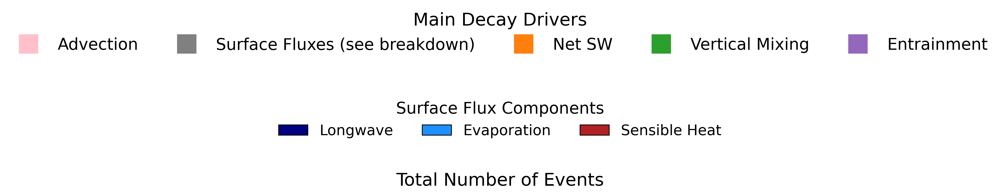

Legend saved as MHW_Decay_Analysis_Figure_Legend.png


In [34]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

# --- CONFIGURATION (Copied from the main script) ---
main_drivers = [
    'Grouped Advection', 'Surface Fluxes Less SW', 'Net Shortwave', 'Grouped Vertical Mixing', 'entrainment'
]
driver_colors = {
    "Grouped Advection": "pink", "Surface Fluxes Less SW": "gray", "Net Shortwave": "#ff7f0e",
    "Grouped Vertical Mixing": "#2ca02c", "entrainment": "#9467bd"
}
legend_main_labels = {
    "Grouped Advection": "Advection", "Surface Fluxes Less SW": "Surface Fluxes (see breakdown)",
    "Net Shortwave": "Net SW", "Grouped Vertical Mixing": "Vertical Mixing", "entrainment": "Entrainment"
}
breakdown_drivers = ["lw_heat", "evap_heat", "sens_heat"]
breakdown_colors = { "lw_heat": "#000080", "evap_heat": "#1E90FF", "sens_heat": "#B22222" }
breakdown_labels = { "lw_heat": "Longwave", "evap_heat": "Evaporation", "sens_heat": "Sensible Heat" }

# --- SCRIPT TO CREATE AND SAVE LEGEND ---
if __name__ == '__main__':
    # Create a figure that is wide and short, just for the legend
    fig_leg = plt.figure(figsize=(20, 3))

    # --- Create handles for both legends ---
    handles_main = [Line2D([0], [0], marker='s', color='w', label=legend_main_labels[drv],
                           markerfacecolor=driver_colors[drv], markersize=25) for drv in main_drivers]
    
    handles_breakdown = [Patch(facecolor=breakdown_colors[drv], edgecolor='black', label=breakdown_labels[drv])
                         for drv in breakdown_drivers]

    # --- Place the legends on the figure ---
    # Main Legend
    leg1 = fig_leg.legend(handles=handles_main, loc='center', ncol=len(handles_main),
                          frameon=False, title="Main Decay Drivers", title_fontsize=22,
                          fontsize=20, bbox_to_anchor=(0.5, 0.75))

    # Breakdown Legend
    leg2 = fig_leg.legend(handles=handles_breakdown, loc='center', ncol=len(handles_breakdown),
                          frameon=False, title='Surface Flux Components', title_fontsize=20,
                          fontsize=18, bbox_to_anchor=(0.5, 0.25))

    # Add the overall x-axis label here
    fig_leg.text(0.5, -0.1, 'Total Number of Events', ha='center', va='center', fontsize=22)

    # Turn off the axis for a clean look
    plt.gca().set_axis_off()

    # Save the legend as a separate file
    # transparent=True is useful for placing it on any background
    fig_leg.savefig("/g/data/e14/ts7341/Figure_Code_For_Manuscript/MHW_Decay_Analysis_Figure_Legend.png", dpi=300, bbox_inches='tight')
    plt.show()
    print("Legend saved as MHW_Decay_Analysis_Figure_Legend.png")

## Breakdown MHW Properties

--- Step 1: Loading Data ---
Loading driver data from: /scratch/e14/ts7341/mhw_stats_ws.nc
Loading MHW stats from: /scratch/e14/ts7341/SEANOE/MHW_Statistics_Mask/full_MHW_data_1982_2024_WS.nc

Driver Dataset Info:
<xarray.Dataset> Size: 395MB
Dimensions:                 (lat: 66, lon: 320, event: 57)
Coordinates:
  * lon                     (lon) float64 3kB -59.88 -59.62 ... 19.62 19.88
  * lat                     (lat) float64 528B -69.99 -69.88 ... -63.17 -63.06
  * event                   (event) int64 456B 0 1 2 3 4 5 ... 51 52 53 54 55 56
Data variables:
    main_driver             (lat, lon, event) <U23 111MB ...
    main_driver_value       (lat, lon, event) float64 10MB ...
    secondary_driver        (lat, lon, event) <U23 111MB ...
    secondary_driver_value  (lat, lon, event) float64 10MB ...
    sub_driver              (lat, lon, event) <U17 82MB ...
    sub_driver_value        (lat, lon, event) float64 10MB ...
    breakdown_driver        (lat, lon, event) <U9 43MB ...
   

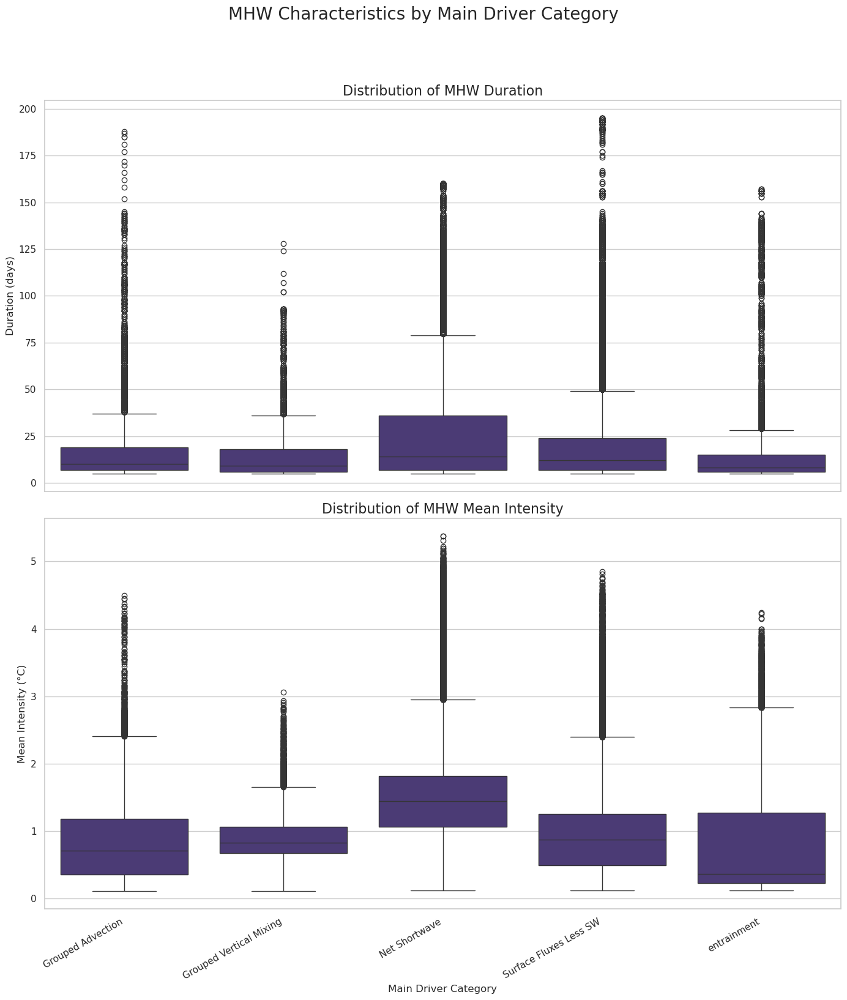


--- Analysis Complete ---


In [6]:
# =============================================================================
# MHW Driver Analysis Script
#
# This script loads two xarray datasets:
#   1. MHW event statistics (duration, intensity, etc.)
#   2. MHW driver classifications for each event.
#
# It then combines this information and generates box and whisker plots to show
# the distribution of MHW duration and mean intensity for each driver category.
#
# Author: Your Name
# Date:   YYYY-MM-DD
# =============================================================================

import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sys

# --- 1. Configuration: EDIT THE FILE PATHS BELOW ---

# Path to the NetCDF file containing the MHW drivers
# This file should contain the 'main_driver' variable.
PATH_TO_DRIVER_DS = '/scratch/e14/ts7341/mhw_stats_ws.nc'

# Path to the NetCDF file containing the MHW statistics
# This file should contain 'duration' and 'intensity_mean' variables.
PATH_TO_MHW_STATS_DS = '/scratch/e14/ts7341/SEANOE/MHW_Statistics_Mask/full_MHW_data_1982_2024_WS.nc'

# --- End of Configuration ---


def main():
    """
    Main function to load, process, and plot the MHW data.
    """
    # --- 2. Load Data ---
    print("--- Step 1: Loading Data ---")
    try:
        print(f"Loading driver data from: {PATH_TO_DRIVER_DS}")
        ds_driver = xr.open_dataset(PATH_TO_DRIVER_DS)
        print(f"Loading MHW stats from: {PATH_TO_MHW_STATS_DS}")
        ds_mhw = xr.open_dataset(PATH_TO_MHW_STATS_DS)
    except FileNotFoundError as e:
        print(f"\nERROR: Could not find a file. Please check your paths.")
        print(f"Details: {e}")
        # sys.exit() is used to stop the script gracefully if files aren't found.
        sys.exit(1)
        
    print("\nDriver Dataset Info:")
    print(ds_driver)
    print("\nMHW Stats Dataset Info:")
    print(ds_mhw)


    # --- 3. Combine Datasets into a Pandas DataFrame ---
    print("\n--- Step 2: Combining and Cleaning Data ---")
    
    # Select the specific variables we need for the analysis
    try:
        drivers = ds_driver['main_driver']
        durations = ds_mhw['duration']
        intensities = ds_mhw['intensity_mean']
    except KeyError as e:
        print(f"\nERROR: A required variable was not found in one of the datasets.")
        print(f"Please ensure 'main_driver', 'duration', and 'intensity_mean' exist.")
        print(f"Details: {e}")
        sys.exit(1)

    # Convert each xarray DataArray to a pandas DataFrame.
    # The (lat, lon, event) coordinates become the DataFrame's index.
    df_drivers = drivers.to_dataframe()
    df_durations = durations.to_dataframe()
    df_intensities = intensities.to_dataframe()

    # Join the three DataFrames together on their common index.
    # This aligns every event's driver with its duration and intensity.
    print("Joining data based on (lat, lon, event) index...")
    df_combined = df_drivers.join(df_durations).join(df_intensities)

    # Clean the data:
    # MHW datasets often have NaNs for grid points/events that did not occur.
    # dropna() removes all rows where ANY of the values are NaN.
    # This is the crucial step to filter for only the valid MHW events.
    df_clean = df_combined.dropna()

    if df_clean.empty:
        print("\nERROR: The combined DataFrame is empty after cleaning.")
        print("This could mean there are no valid, overlapping events in your datasets,")
        print("or the variable names do not match. Please check your input files.")
        sys.exit(1)
        
    print(f"\nSuccessfully found and combined {len(df_clean)} valid MHW events.")
    print("\nSample of the final cleaned DataFrame:")
    print(df_clean.head())


    # --- 4. Create Box and Whisker Plots ---
    print("\n--- Step 3: Generating Plots ---")
    
    # Set a nice plot style
    sns.set_theme(style="whitegrid", palette="viridis")

    # Get the unique driver categories and sort them for consistent plot ordering
    driver_order = sorted(df_clean['main_driver'].unique())
    
    # Create a figure with two subplots stacked vertically
    fig, axes = plt.subplots(2, 1, figsize=(14, 16), sharex=True)
    fig.suptitle('MHW Characteristics by Main Driver Category', fontsize=20, y=1.02)

    # --- Plot 1: MHW Duration by Driver ---
    sns.boxplot(
        ax=axes[0],
        data=df_clean,
        x='main_driver',
        y='duration',
        order=driver_order
    )
    axes[0].set_title('Distribution of MHW Duration', fontsize=16)
    axes[0].set_xlabel('') # Hide x-label as it's shared
    axes[0].set_ylabel('Duration (days)', fontsize=12)

    # --- Plot 2: MHW Mean Intensity by Driver ---
    sns.boxplot(
        ax=axes[1],
        data=df_clean,
        x='main_driver',
        y='intensity_mean',
        order=driver_order
    )
    axes[1].set_title('Distribution of MHW Mean Intensity', fontsize=16)
    axes[1].set_xlabel('Main Driver Category', fontsize=12)
    axes[1].set_ylabel('Mean Intensity (°C)', fontsize=12)
    
    # Rotate x-axis labels for better readability if they are long
    plt.xticks(rotation=30, ha='right')

    # Adjust layout to prevent titles/labels from overlapping
    plt.tight_layout(rect=[0, 0, 1, 0.98])

    # Show the final plot
    plt.show()

    print("\n--- Analysis Complete ---")


# This is standard Python practice to ensure the script runs only when
# executed directly (not when imported as a module).
if __name__ == "__main__":
    # Check if paths have been changed from their placeholder values
    if 'path/to/your' in PATH_TO_DRIVER_DS or 'path/to/your' in PATH_TO_MHW_STATS_DS:
        print("="*60)
        print("!!! PLEASE EDIT THE FILE PATHS IN THE SCRIPT !!!")
        print("="*60)
        print(f"Current driver path: {PATH_TO_DRIVER_DS}")
        print(f"Current MHW stats path: {PATH_TO_MHW_STATS_DS}")
        print("\nExiting script. Please update the paths and run again.")
    else:
        main()

In [6]:
ds = xr.open_dataset('/g/data/e14/ts7341/Figure_Code_For_Manuscript/Science/melt_during_mhw.nc')
ds

<xarray.Dataset> Size: 10MB
Dimensions:                (lat: 66, lon: 320, event: 57)
Coordinates:
  * lon                    (lon) float64 3kB -59.88 -59.62 ... 19.62 19.88
  * lat                    (lat) float64 528B -69.99 -69.88 ... -63.17 -63.06
  * event                  (event) int64 456B 0 1 2 3 4 5 ... 51 52 53 54 55 56
Data variables:
    precursor_mh_flux_sum  (lat, lon, event) float64 10MB ...

In [9]:
# =============================================================================
# MHW Regional Event Analysis (Aesthetic Horizontal Box Plots)
#
# This script aggregates MHW pixel-events into regional events and creates
# high-quality, horizontal box plots showing the distribution of their
# duration, intensity, AND precursor heat flux, grouped by the dominant sub-driver.
# =============================================================================

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. PLOT FORMATTING & CONFIGURATION ---
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 22,
    'legend.fontsize': 18,
    'figure.dpi': 600,
})

# --- Driver Colors and Labels ---
SUB_DRIVER_COLORS = {"Qprime_1ovrHbar": '#E69F00', "Qbar_1ovrHprime": '#CC79A7', "Qprime_1ovrHprime": 'grey'}
SUB_TERM_LABELS = {"Qprime_1ovrHbar": r"$Q'/\bar{H}$", "Qbar_1ovrHprime": r"$\bar{Q}/H'$", "Qprime_1ovrHprime": r"$Q'/H'$"}

# --- Analysis Parameters ---
MONTHS_TO_ANALYZE = [11, 12]
SAVE_PLOT_PATH = 'mhw_sub_driver_distributions_with_flux.png'

# --- Data Paths & Binning Configuration ---
PATH_TO_DRIVER_DS = '/scratch/e14/ts7341/mhw_stats_ws.nc'
PATH_TO_MHW_STATS_DS = '/scratch/e14/ts7341/SEANOE/MHW_Statistics_Mask/full_MHW_data_1982_2024_WS.nc'
# !!! ENSURE this path is correct for the file containing 'precursor_mh_flux_sum' !!!
PATH_TO_PRECURSOR_DS = '/g/data/e14/ts7341/Figure_Code_For_Manuscript/Science/melt_during_mhw.nc'# Please update this path

LAT_BINS = [-70, -63]
LON_BINS = np.arange(-60, 21, 5)

# --- 2. HELPER FUNCTION ---

def process_and_aggregate_data(ds_driver, ds_mhw, ds_precursor, lat_bins, lon_bins, months):
    """
    Takes pre-loaded and sliced xarray Datasets, merges them, and aggregates
    pixel data into regional events.
    """
    print("--- Merging pre-sliced datasets ---")
    ds_combined = xr.merge([
        ds_driver['sub_driver'],
        ds_mhw['duration'],
        ds_mhw['intensity_mean'],
        ds_mhw['date_start'],
        ds_precursor['precursor_mh_flux_sum']
    ])
    
    df_pixels = ds_combined.to_dataframe().reset_index().dropna()
    df_pixels = df_pixels[df_pixels['sub_driver'].str.strip() != '']
    df_pixels['date_start'] = pd.to_datetime(df_pixels['date_start'])
    df_pixels['month'] = df_pixels['date_start'].dt.month

    df_filtered = df_pixels[df_pixels['month'].isin(months)].copy()
    print(f"Found {len(df_filtered)} pixel-level events in the domain for the specified months.")

    df_filtered['lat_bin'] = pd.cut(df_filtered['lat'], bins=lat_bins, right=False)
    df_filtered['lon_bin'] = pd.cut(df_filtered['lon'], bins=lon_bins, right=False)
    df_filtered['year'] = df_filtered['date_start'].dt.year

    print("--- Aggregating into regional events ---")
    group_key = ['year', 'month', 'lat_bin', 'lon_bin']
    df_regional_events = df_filtered.groupby(group_key, observed=False).agg(
        dominant_driver=('sub_driver', lambda x: x.mode()[0]),
        mean_duration=('duration', 'mean'),
        mean_intensity=('intensity_mean', 'mean'),
        mean_precursor_flux=('precursor_mh_flux_sum', 'mean') # Correct name
    ).reset_index()
    
    print(f"Aggregated into {len(df_regional_events)} distinct regional events.")
    return df_regional_events


# --- 3. MAIN EXECUTION ---
if __name__ == '__main__':
    # --- Pre-load and slice data as you suggested ---
    print("--- Loading and pre-slicing all datasets ---")
    
    # Define the common spatial domain
    lat_slice = slice(-70, -63)
    lon_slice = slice(-60, 20)
    
    ds_driver = xr.open_dataset(PATH_TO_DRIVER_DS).sel(lat=lat_slice, lon=lon_slice)
    ds_mhw = xr.open_dataset(PATH_TO_MHW_STATS_DS).sel(lat=lat_slice, lon=lon_slice)
    ds_precursor = xr.open_dataset(PATH_TO_PRECURSOR_DS).sel(lat=lat_slice, lon=lon_slice)

    # --- Pass the pre-processed data to the function ---
    regional_events_df = process_and_aggregate_data(
        ds_driver, ds_mhw, ds_precursor, LAT_BINS, LON_BINS, MONTHS_TO_ANALYZE
    )

    # --- Plotting ---
    if not regional_events_df.empty:
        driver_order = regional_events_df.groupby('dominant_driver')['mean_duration'].median().sort_values(ascending=False).index.tolist()
        ytick_labels_ordered = [SUB_TERM_LABELS.get(drv, drv) for drv in driver_order]

        fig, axes = plt.subplots(ncols=3, nrows=1, figsize=(26, 8), sharey=True)
        fig.suptitle('MHW Regional Event Characteristics by Dominant Driver\n(Events Starting in Nov/Dec, All Years)',
                     fontsize=24, weight='bold', y=0.98)

        # Panel (a): Duration
        ax_dur = axes[0]
        sns.boxplot(ax=ax_dur, data=regional_events_df, y='dominant_driver', x='mean_duration',
                    order=driver_order, palette=SUB_DRIVER_COLORS, orient='h', hue='dominant_driver', legend=False)
        ax_dur.set_title("Duration", weight='bold')
        ax_dur.set_xlabel("Mean Duration (days)")
        ax_dur.set_ylabel("")
        ax_dur.set_yticklabels(ytick_labels_ordered)
        ax_dur.text(-0.18, 1.0, '(a)', transform=ax_dur.transAxes, size=24, weight='bold')

        # Panel (b): Intensity
        ax_int = axes[1]
        sns.boxplot(ax=ax_int, data=regional_events_df, y='dominant_driver', x='mean_intensity',
                    order=driver_order, palette=SUB_DRIVER_COLORS, orient='h', hue='dominant_driver', legend=False)
        ax_int.set_title("Cumulative Intensity", weight='bold')
        ax_int.set_xlabel("Mean Cum. Intensity (°C-days)")
        ax_int.set_ylabel("")
        ax_int.text(-0.1, 1.0, '(b)', transform=ax_int.transAxes, size=24, weight='bold')

        # Panel (c): Precursor Heat Flux --- ***FIXED HERE*** ---
        ax_flux = axes[2]
        sns.boxplot(ax=ax_flux, data=regional_events_df, y='dominant_driver', x='mean_precursor_flux', # <-- CORRECT VARIABLE NAME
                    order=driver_order, palette=SUB_DRIVER_COLORS, orient='h', hue='dominant_driver', legend=False)
        ax_flux.set_title("Precursor Heat Flux", weight='bold')
        ax_flux.set_xlabel("Mean Precursor Flux (W/m²)")
        ax_flux.set_ylabel("")
        ax_flux.text(-0.1, 1.0, '(c)', transform=ax_flux.transAxes, size=24, weight='bold')

        # Aesthetics
        for ax in axes:
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)
            counts = regional_events_df['dominant_driver'].value_counts()
            for i, driver in enumerate(driver_order):
                count = counts.get(driver, 0)
                ax.text(ax.get_xlim()[1] * 1.01, i, f" n={count}", ha='left', va='center', fontsize=16, color='dimgray')

        fig.subplots_adjust(top=0.86, wspace=0.2)
        if SAVE_PLOT_PATH:
            plt.savefig(SAVE_PLOT_PATH, dpi=300, bbox_inches='tight')
            print(f"Plot saved to {SAVE_PLOT_PATH}")
        plt.show()

--- Loading and pre-slicing all datasets ---
--- Merging pre-sliced datasets ---
Found 151522 pixel-level events in the domain for the specified months.
--- Aggregating into regional events ---
Aggregated into 1344 distinct regional events.


/jobfs/153275522.gadi-pbs/ipykernel_2815197/264095908.py:118: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_dur.set_yticklabels(ytick_labels_ordered)


Plot saved to mhw_sub_driver_distributions_with_flux.png


In [10]:
# =============================================================================
# MHW Regional Event Analysis - Comparison of Time Periods
#
# This script aggregates MHW pixel-events into regional events for two periods
# (All Years vs. 2017-onward) and creates a two-row comparison plot showing the
# distribution of duration, intensity, and precursor flux by dominant sub-driver,
# WITH A FIXED Y-AXIS ORDER.
# =============================================================================

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. PLOT FORMATTING & CONFIGURATION ---
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.labelsize': 24,
    'axes.titlesize': 24,
    'xtick.labelsize': 20,
    'ytick.labelsize': 24,
    'legend.fontsize': 20,
    'figure.dpi': 600,
})

# --- Driver Colors and Labels ---
SUB_DRIVER_COLORS = {"Qprime_1ovrHbar": '#E69F00', "Qbar_1ovrHprime": '#CC79A7', "Qprime_1ovrHprime": 'grey'}
SUB_TERM_LABELS = {"Qprime_1ovrHbar": r"$Q'/\bar{H}$", "Qbar_1ovrHprime": r"$\bar{Q}/H'$", "Qprime_1ovrHprime": r"$Q'/H'$"}

# --- Analysis Parameters ---
MONTHS_TO_ANALYZE = [11, 12]
YEAR_SPLIT = 2017
SAVE_PLOT_PATH = '/g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/Generalised_Drivers_Combined_Fixed_Order.png'

# --- Data Paths & Binning Configuration ---
PATH_TO_DRIVER_DS = '/scratch/e14/ts7341/mhw_stats_ws.nc'
PATH_TO_MHW_STATS_DS = '/scratch/e14/ts7341/SEANOE/MHW_Statistics_Mask/full_MHW_data_1982_2024_WS.nc'
PATH_TO_PRECURSOR_DS = '/g/data/e14/ts7341/Figure_Code_For_Manuscript/Science/melt_during_mhw.nc'

LAT_BINS = np.arange(-70,-63,2.5)
LON_BINS = np.arange(-60, 21, 5)

# --- 2. HELPER FUNCTION ---
def process_and_aggregate_data(ds_driver, ds_mhw, ds_precursor, lat_bins, lon_bins, months):
    """
    Takes pre-loaded xarray Datasets, merges them, and aggregates
    pixel data into regional events.
    """
    print("--- Merging datasets ---")
    ds_combined = xr.merge([
        ds_driver['sub_driver'],
        ds_mhw['duration'],
        ds_mhw['intensity_mean'],
        ds_mhw['date_start'],
        ds_precursor['precursor_mh_flux_sum']
    ])

    df_pixels = ds_combined.to_dataframe().reset_index().dropna()
    df_pixels = df_pixels[df_pixels['sub_driver'].str.strip() != '']
    df_pixels['date_start'] = pd.to_datetime(df_pixels['date_start'])
    df_pixels['month'] = df_pixels['date_start'].dt.month

    df_filtered = df_pixels[df_pixels['month'].isin(months)].copy()
    print(f"Found {len(df_filtered)} valid pixel-level events.")

    df_filtered['lat_bin'] = pd.cut(df_filtered['lat'], bins=lat_bins, right=False)
    df_filtered['lon_bin'] = pd.cut(df_filtered['lon'], bins=lon_bins, right=False)
    df_filtered['year'] = df_filtered['date_start'].dt.year

    print("--- Aggregating into regional events ---")
    group_key = ['year', 'month', 'lat_bin', 'lon_bin']
    df_regional_events = df_filtered.groupby(group_key, observed=False).agg(
        dominant_driver=('sub_driver', lambda x: x.mode()[0]),
        mean_duration=('duration', 'mean'),
        mean_intensity=('intensity_mean', 'mean'),
        mean_precursor_flux=('precursor_mh_flux_sum', 'mean')
    ).reset_index()

    print(f"Aggregated into {len(df_regional_events)} distinct regional events.")
    return df_regional_events


# --- 3. MAIN EXECUTION ---
if __name__ == '__main__':
    # --- Pre-load and slice data to the spatial domain ONCE ---
    print("--- Loading and pre-slicing all datasets to spatial domain ---")
    lat_slice = slice(-70, -63)
    lon_slice = slice(-60, 20)

    ds_driver_full = xr.open_dataset(PATH_TO_DRIVER_DS).sel(lat=lat_slice, lon=lon_slice)
    ds_mhw_full = xr.open_dataset(PATH_TO_MHW_STATS_DS).sel(lat=lat_slice, lon=lon_slice)
    ds_precursor_full = xr.open_dataset(PATH_TO_PRECURSOR_DS).sel(lat=lat_slice, lon=lon_slice)

    # --- Analysis 1: All Years ---
    print("\n" + "="*50)
    print("ANALYSIS 1: ALL YEARS (1982-2024)")
    print("="*50)
    df_all_years = process_and_aggregate_data(
        ds_driver_full, ds_mhw_full, ds_precursor_full, LAT_BINS, LON_BINS, MONTHS_TO_ANALYZE
    )

    # --- Analysis 2: Recent Years (2017-onward) ---
    print("\n" + "="*50)
    print(f"ANALYSIS 2: RECENT YEARS ({YEAR_SPLIT}-2024)")
    print("="*50)

    year_mask = ds_mhw_full['date_start'].dt.year >= YEAR_SPLIT
    ds_driver_recent = ds_driver_full.where(year_mask, drop=True)
    ds_mhw_recent = ds_mhw_full.where(year_mask, drop=True)
    ds_precursor_recent = ds_precursor_full.where(year_mask, drop=True)

    df_recent_years = process_and_aggregate_data(
        ds_driver_recent, ds_mhw_recent, ds_precursor_recent, LAT_BINS, LON_BINS, MONTHS_TO_ANALYZE
    )

    # --- Create the 2x3 Comparison Plot ---
    print("\n--- Generating comparison plot ---")
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(26, 17), sharey=True)
    fig.suptitle('MHW Characteristics by Dominant Driver: A Comparison of Time Periods\n(Events Starting in Nov/Dec)',
                 fontsize=30, weight='bold', y=0.97)

    # =========================================================================
    # --- THE FIX: Define a FIXED, EXPLICIT order for the y-axis as requested ---
    master_driver_order = ["Qprime_1ovrHbar", "Qbar_1ovrHprime", "Qprime_1ovrHprime"]
    # =========================================================================
    
    ytick_labels_ordered = [SUB_TERM_LABELS.get(drv, drv) for drv in master_driver_order]
    print(f"\nUsing FIXED plot order: {master_driver_order}")

    plot_data = [
        (f'All Years (1982-2024)', df_all_years, axes[0]),
        (f'Recent Years ({YEAR_SPLIT}-2024)', df_recent_years, axes[1])
    ]

    for period_label, df, ax_row in plot_data:
        if df.empty:
            print(f"Skipping plot for {period_label} as no data was found.")
            for ax in ax_row:
                ax.text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=20, transform=ax.transAxes)
            continue

        ax_dur, ax_int, ax_flux = ax_row
        ax_dur.set_ylabel(period_label, fontsize=26, weight='bold')
        ax_dur.set_yticklabels(ytick_labels_ordered)

        # --- Use the 'master_driver_order' for ALL plots ---
        sns.boxplot(ax=ax_dur, data=df, y='dominant_driver', x='mean_duration',
                    order=master_driver_order, palette=SUB_DRIVER_COLORS, orient='h', hue='dominant_driver', legend=False)
        ax_dur.set_title("Duration", weight='bold')
        ax_dur.set_xlabel("Mean Duration (days)")

        sns.boxplot(ax=ax_int, data=df, y='dominant_driver', x='mean_intensity',
                    order=master_driver_order, palette=SUB_DRIVER_COLORS, orient='h', hue='dominant_driver', legend=False)
        ax_int.set_title("Cumulative Intensity", weight='bold')
        ax_int.set_xlabel("Mean Cumulative Intensity (°C / day)")

        sns.boxplot(ax=ax_flux, data=df, y='dominant_driver', x='mean_precursor_flux',
                    order=master_driver_order, palette=SUB_DRIVER_COLORS, orient='h', hue='dominant_driver', legend=False)
        ax_flux.set_title("Summed Precursor Sea-Ice Melt", weight='bold')
        ax_flux.set_xlabel("Summed Precursor Sea-Ice Melt (°C / day)")

        for ax in ax_row:
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)
            ax.set_ylabel("")
            counts = df['dominant_driver'].value_counts()
            for i, driver in enumerate(master_driver_order):
                count = counts.get(driver, 0)
                ax.text(ax.get_xlim()[1] * 1.01, i, f" n={count}", ha='left', va='center', fontsize=18, color='dimgray')

    # Add panel labels (a, b, c, d, e, f)
    panel_label_props = {'size': 28, 'weight': 'bold'}
    axes[0, 0].text(-0.25, 1.02, '(a)', transform=axes[0, 0].transAxes, **panel_label_props)
    axes[0, 1].text(-0.1, 1.02, '(b)', transform=axes[0, 1].transAxes, **panel_label_props)
    axes[0, 2].text(-0.1, 1.02, '(c)', transform=axes[0, 2].transAxes, **panel_label_props)
    axes[1, 0].text(-0.25, 1.02, '(d)', transform=axes[1, 0].transAxes, **panel_label_props)
    axes[1, 1].text(-0.1, 1.02, '(e)', transform=axes[1, 1].transAxes, **panel_label_props)
    axes[1, 2].text(-0.1, 1.02, '(f)', transform=axes[1, 2].transAxes, **panel_label_props)

    fig.subplots_adjust(top=0.90, hspace=0.4, wspace=0.25)

    if SAVE_PLOT_PATH:
        plt.savefig(SAVE_PLOT_PATH, dpi=300, bbox_inches='tight')
        print(f"\nComparison plot saved to {SAVE_PLOT_PATH}")
    plt.show()

--- Loading and pre-slicing all datasets to spatial domain ---

ANALYSIS 1: ALL YEARS (1982-2024)
--- Merging datasets ---
Found 151522 valid pixel-level events.
--- Aggregating into regional events ---
Aggregated into 2688 distinct regional events.

ANALYSIS 2: RECENT YEARS (2017-2024)
--- Merging datasets ---
Found 35398 valid pixel-level events.
--- Aggregating into regional events ---
Aggregated into 448 distinct regional events.

--- Generating comparison plot ---

Using FIXED plot order: ['Qprime_1ovrHbar', 'Qbar_1ovrHprime', 'Qprime_1ovrHprime']


/jobfs/153296025.gadi-pbs/ipykernel_3209783/3950511679.py:145: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_dur.set_yticklabels(ytick_labels_ordered)
/jobfs/153296025.gadi-pbs/ipykernel_3209783/3950511679.py:145: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_dur.set_yticklabels(ytick_labels_ordered)



Comparison plot saved to /g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/Generalised_Drivers_Combined_Fixed_Order.png
